<a href="https://colab.research.google.com/github/siim2mary/OIBSIP/blob/main/UNEMPLOYMENT_ANALYSIS_WITH_PYTHON3oas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 **UNEMPLOYMENT ANALYSIS WITH PYTHON**

---



PROJECT-2

---



# **UNEMPLOYMENT ANALYSIS WITH PYTHON**

---



Introduction:

Unemployment is a critical economic indicator that reflects the health of a nation's labor market. In the context of India, understanding and analyzing unemployment is of paramount importance due to its impact on the socio-economic fabric of the country. With a large and diverse population, India faces unique challenges in managing and addressing unemployment issues.

Python, as a versatile programming language, provides a powerful toolset for data analysis and visualization. By leveraging Python's libraries such as Pandas, Matplotlib, and NumPy, one can explore and interpret unemployment data effectively. This introduction will outline the significance of studying unemployment in India and how Python can be employed for a comprehensive analysis.

Significance of Unemployment Analysis in India:

India's demographic dividend, with a significant portion of the population in the working-age group, makes employment crucial for sustainable economic growth.
Unemployment rates impact various aspects of society, including poverty levels, social stability, and overall well-being.
Understanding the patterns and trends in unemployment helps policymakers formulate effective strategies for job creation and economic development.
Python as a Data Analysis Tool:

Python has gained popularity in the field of data science and analysis due to its simplicity, readability, and a vast ecosystem of libraries.
Libraries like Pandas enable efficient data manipulation and cleaning, while NumPy provides support for numerical operations.
Matplotlib and Seaborn are powerful tools for visualizing data, allowing for the creation of insightful graphs and charts.
Objectives of the Analysis:

Identify and analyze historical trends in unemployment rates in India.
Examine regional variations in unemployment to understand geographical disparities.
Correlate economic indicators with unemployment data to derive meaningful insights.
Visualize the data to make it accessible and understandable for a broader audience.
Methodology:

Utilize Python's Pandas for data loading, cleaning, and manipulation.
Apply statistical analysis techniques to uncover patterns and trends in the unemployment dataset.
Use Matplotlib and Seaborn for data visualization to enhance interpretation.
Consider employing machine learning models for predictive analysis if applicable.
Structure of the Analysis:

Data Collection: Gather relevant datasets containing unemployment data in India.
Data Cleaning: Handle missing values, outliers, and format inconsistencies.
Exploratory Data Analysis (EDA): Explore the dataset, identify patterns, and formulate hypotheses.
Visualization: Create informative graphs and charts to communicate findings effectively.
Interpretation: Draw conclusions and insights from the analysis, offering potential policy implications.
In conclusion, combining the significance of unemployment analysis in India with the capabilities of Python for data analysis and visualization presents an excellent opportunity to derive meaningful insights and contribute to informed decision-making in the realm of economic policy and development.

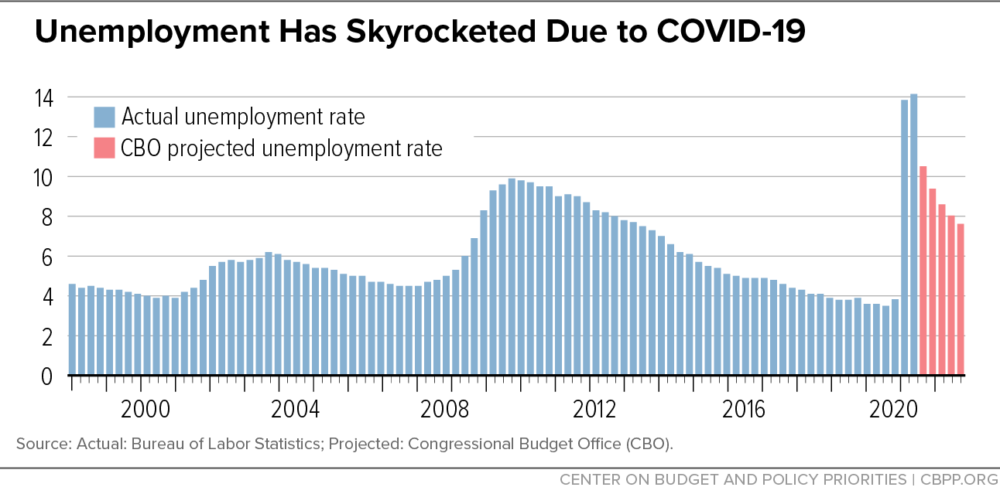

In [527]:
!pip install --upgrade scikit-learn


  Using cached scikit_learn-1.3.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (10.8 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.0
    Uninstalling scikit-learn-1.2.0:
      Successfully uninstalled scikit-learn-1.2.0


In [528]:
!pip install scikit-learn==1.2.0

  Using cached scikit_learn-1.2.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (9.5 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.3.2
    Uninstalling scikit-learn-1.3.2:
      Successfully uninstalled scikit-learn-1.3.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 0.17.0 requires scikit-learn>=1.2.2, but you have scikit-learn 1.2.0 which is incompatible.


**Import necessary Libraries**

---





In [529]:
# Import necessary libraries

# Importing Python Libraries for Data Processing
import os,sys
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# Data Visualization Libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
import plotly.express as px
import plotly.graph_objects as go


# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

# Natural Language Processing (NLP) and Text Analysis Libraries
import re
import string


# Scikit-Learn (sklearn) Libraries for Machine Learning and Evaluations
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

#Models used
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
#from sklearn.ensemble import DecisionTreeClassifier
from sklearn.svm import SVC

#Evaluation Algorithms
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

#Dealing with imbalanced dataset
from imblearn.over_sampling import SMOTE


In [530]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [531]:
path_to_file1= '/content/drive/MyDrive/Unemployment in India.csv'

In [532]:
path_to_file2 = '/content/drive/MyDrive/Unemployment_Rate_upto_11_2020.csv'

In [533]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [534]:
import shutil

# Copy the file to the current working directory in Colab
shutil.copy(path_to_file1, './Unemployment in India.csv')
shutil.copy(path_to_file2, './Unemployment_Rate_upto_11_2020')

'./Unemployment_Rate_upto_11_2020'

IMPORT DATASET

---



In [535]:
df1 = pd.read_csv('/content/Unemployment in India.csv')

In [536]:
df2 = pd.read_csv('/content/Unemployment_Rate_upto_11_2020')

READ DATASET

---



In [537]:
df1.head()

,Region,Date,Frequency,Estimated Unemployment Rate (%),Estimated Employed,Estimated Labour Participation Rate (%),Area
0,Andhra Pradesh,31-05-2019,Monthly,3.65,11999139.0,43.24,Rural
1,Andhra Pradesh,30-06-2019,Monthly,3.05,11755881.0,42.05,Rural
2,Andhra Pradesh,31-07-2019,Monthly,3.75,12086707.0,43.50,Rural
3,Andhra Pradesh,31-08-2019,Monthly,3.32,12285693.0,43.97,Rural
4,Andhra Pradesh,30-09-2019,Monthly,5.17,12256762.0,44.68,Rural


In [538]:
df1.shape

(768, 7)

In [539]:
df2.head()

,Region,Date,Frequency,Estimated Unemployment Rate (%),Estimated Employed,Estimated Labour Participation Rate (%),Region.1,longitude,latitude
0,Andhra Pradesh,31-01-2020,M,5.48,16635535,41.02,South,15.9129,79.74
1,Andhra Pradesh,29-02-2020,M,5.83,16545652,40.90,South,15.9129,79.74
2,Andhra Pradesh,31-03-2020,M,5.79,15881197,39.18,South,15.9129,79.74
3,Andhra Pradesh,30-04-2020,M,20.51,11336911,33.10,South,15.9129,79.74
4,Andhra Pradesh,31-05-2020,M,17.43,12988845,36.46,South,15.9129,79.74


I am taking only df2 dataset which has all regions ,latitude,longitude for processing and model building.

In [540]:
# Remove leading spaces from column names
df1.columns = df1.columns.str.strip()
df2.columns = df2.columns.str.strip()

In [541]:
# Remove leading and trailing whitespaces in 'Frequency' column
df1['Frequency'] = df1['Frequency'].str.strip()

# Replace 'Monthly' with 'M' in df1 in-place
df1['Frequency'].replace('Monthly', 'M', inplace=True)


In [542]:
df1.head()

,Region,Date,Frequency,Estimated Unemployment Rate (%),Estimated Employed,Estimated Labour Participation Rate (%),Area
0,Andhra Pradesh,31-05-2019,M,3.65,11999139.0,43.24,Rural
1,Andhra Pradesh,30-06-2019,M,3.05,11755881.0,42.05,Rural
2,Andhra Pradesh,31-07-2019,M,3.75,12086707.0,43.50,Rural
3,Andhra Pradesh,31-08-2019,M,3.32,12285693.0,43.97,Rural
4,Andhra Pradesh,30-09-2019,M,5.17,12256762.0,44.68,Rural


In [543]:
df1.columns

Index(['Region', 'Date', 'Frequency', 'Estimated Unemployment Rate (%)',
       'Estimated Employed', 'Estimated Labour Participation Rate (%)',
       'Area'],
      dtype='object')

In [544]:
df2.columns

Index(['Region', 'Date', 'Frequency', 'Estimated Unemployment Rate (%)',
       'Estimated Employed', 'Estimated Labour Participation Rate (%)',
       'Region.1', 'longitude', 'latitude'],
      dtype='object')

Merge df1 and df2 to df3 on common columns

---



In [545]:
# Merge the DataFrames on common columns
df3 = pd.merge(df1, df2, on=['Region', 'Date', 'Frequency','Estimated Unemployment Rate (%)',
       'Estimated Employed', 'Estimated Labour Participation Rate (%)'], how='outer')

In [546]:
df3.head()

,Region,Date,Frequency,Estimated Unemployment Rate (%),Estimated Employed,Estimated Labour Participation Rate (%),Area,Region.1,longitude,latitude
0,Andhra Pradesh,31-05-2019,M,3.65,11999139.0,43.24,Rural,NaN,NaN,NaN
1,Andhra Pradesh,30-06-2019,M,3.05,11755881.0,42.05,Rural,NaN,NaN,NaN
2,Andhra Pradesh,31-07-2019,M,3.75,12086707.0,43.50,Rural,NaN,NaN,NaN
3,Andhra Pradesh,31-08-2019,M,3.32,12285693.0,43.97,Rural,NaN,NaN,NaN
4,Andhra Pradesh,30-09-2019,M,5.17,12256762.0,44.68,Rural,NaN,NaN,NaN


In [547]:
# If there are columns with the same name but different values, you may want to rename them
# For example, if ' Estimated Unemployment Rate (%)' is present in both DataFrames
df3.rename(columns={'Region': 'States', 'Estimated Unemployment Rate (%)': 'Estimated Unemployment Rate',
                    'Estimated Labour Participation Rate (%)': 'Estimated Labour Participation Rate',
                    'Region.1': 'Zones'},
           inplace=True)

In [548]:
df3.head()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude
0,Andhra Pradesh,31-05-2019,M,3.65,11999139.0,43.24,Rural,NaN,NaN,NaN
1,Andhra Pradesh,30-06-2019,M,3.05,11755881.0,42.05,Rural,NaN,NaN,NaN
2,Andhra Pradesh,31-07-2019,M,3.75,12086707.0,43.50,Rural,NaN,NaN,NaN
3,Andhra Pradesh,31-08-2019,M,3.32,12285693.0,43.97,Rural,NaN,NaN,NaN
4,Andhra Pradesh,30-09-2019,M,5.17,12256762.0,44.68,Rural,NaN,NaN,NaN


In [549]:
df3.tail()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude
1030,West Bengal,30-06-2020,M,7.29,30726310.0,40.39,NaN,East,22.9868,87.855
1031,West Bengal,31-07-2020,M,6.83,35372506.0,46.17,NaN,East,22.9868,87.855
1032,West Bengal,31-08-2020,M,14.87,33298644.0,47.48,NaN,East,22.9868,87.855
1033,West Bengal,30-09-2020,M,9.35,35707239.0,47.73,NaN,East,22.9868,87.855
1034,West Bengal,31-10-2020,M,9.98,33962549.0,45.63,NaN,East,22.9868,87.855


Replace Nan Values

---



In [550]:
# If you want to fill NaN values with a specific value, you can use the fillna method
# For example, fill NaN in ' Area, Zones,latitude,longitude' with values With Most frequent ' mean,mode'

df3['Area'].fillna(df3['Area'].mode()[0], inplace=True)
df3['latitude'].fillna(df3['latitude'].mean(),inplace=True)
df3['longitude'].fillna(df3['latitude'].mean(), inplace=True)
df3['Zones'].fillna(df3['Zones'].mode()[0], inplace = True)


In [551]:
df3.head()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude
0,Andhra Pradesh,31-05-2019,M,3.65,11999139.0,43.24,Rural,North,80.532425,80.532425
1,Andhra Pradesh,30-06-2019,M,3.05,11755881.0,42.05,Rural,North,80.532425,80.532425
2,Andhra Pradesh,31-07-2019,M,3.75,12086707.0,43.50,Rural,North,80.532425,80.532425
3,Andhra Pradesh,31-08-2019,M,3.32,12285693.0,43.97,Rural,North,80.532425,80.532425
4,Andhra Pradesh,30-09-2019,M,5.17,12256762.0,44.68,Rural,North,80.532425,80.532425


In [552]:
df3.tail()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude
1030,West Bengal,30-06-2020,M,7.29,30726310.0,40.39,Urban,East,22.9868,87.855
1031,West Bengal,31-07-2020,M,6.83,35372506.0,46.17,Urban,East,22.9868,87.855
1032,West Bengal,31-08-2020,M,14.87,33298644.0,47.48,Urban,East,22.9868,87.855
1033,West Bengal,30-09-2020,M,9.35,35707239.0,47.73,Urban,East,22.9868,87.855
1034,West Bengal,31-10-2020,M,9.98,33962549.0,45.63,Urban,East,22.9868,87.855


check Null values

---



In [553]:
df3.isna().sum()

States                                 28
Date                                   28
Frequency                              28
Estimated Unemployment Rate            28
Estimated Employed                     28
Estimated Labour Participation Rate    28
Area                                    0
Zones                                   0
longitude                               0
latitude                                0
dtype: int64

Fill Null Values for Frequency

---



In [554]:
# Display unique values in the 'Frequency' column before filling missing values
print("Unique values in 'Frequency' before filling missing values:")
print(df3['Frequency'].unique())

Unique values in 'Frequency' before filling missing values:
['M' nan ' M']


In [555]:
# Fill missing values in the 'Frequency' column with the mode
df3['Frequency'].fillna(df3['Frequency'].mode()[0], inplace=True)

# Display unique values in the 'Frequency' column after filling missing values
print("\nUnique values in 'Frequency' after filling missing values:")
print(df3['Frequency'].unique())


Unique values in 'Frequency' after filling missing values:
['M' ' M']


Fill Null Values

---



In [556]:
df3['States'] = df3['States'].fillna(df3['States'].mode()[0])
df3['Date'] = df3['Date'].fillna(df3['Date'].mode()[0])
df3['Estimated Unemployment Rate'] = df3['Estimated Unemployment Rate'].fillna(df3['Estimated Unemployment Rate'].mode()[0])
df3['Estimated Employed'] = df3['Estimated Employed'].fillna(df3['Estimated Employed'].mode()[0])
df3['Estimated Labour Participation Rate'] = df3['Estimated Labour Participation Rate'].fillna(df3['Estimated Labour Participation Rate'].mode()[0])



In [557]:
df3.head()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude
0,Andhra Pradesh,31-05-2019,M,3.65,11999139.0,43.24,Rural,North,80.532425,80.532425
1,Andhra Pradesh,30-06-2019,M,3.05,11755881.0,42.05,Rural,North,80.532425,80.532425
2,Andhra Pradesh,31-07-2019,M,3.75,12086707.0,43.50,Rural,North,80.532425,80.532425
3,Andhra Pradesh,31-08-2019,M,3.32,12285693.0,43.97,Rural,North,80.532425,80.532425
4,Andhra Pradesh,30-09-2019,M,5.17,12256762.0,44.68,Rural,North,80.532425,80.532425


In [558]:
df3.isnull().sum()

States                                 0
Date                                   0
Frequency                              0
Estimated Unemployment Rate            0
Estimated Employed                     0
Estimated Labour Participation Rate    0
Area                                   0
Zones                                  0
longitude                              0
latitude                               0
dtype: int64

In [559]:
# Check for duplicates based on 'Region'
duplicates = df3.duplicated(subset=['States'])
print("Number of duplicates based on 'states':", duplicates.sum())

Number of duplicates based on 'states': 1007


In [560]:
df3.duplicated().sum()

27

In [561]:
# Check for missing values in 'longitude' and 'latitude' columns
missing_values = df3[['States','Date','Frequency','longitude', 'latitude']].isnull().sum()
print("\nMissing values in 'states','Date','Frequency','longitude' and 'latitude' columns:")
print(missing_values)



Missing values in 'states','Date','Frequency','longitude' and 'latitude' columns:
States       0
Date         0
Frequency    0
longitude    0
latitude     0
dtype: int64


Drop Duplicates

---



In [562]:
# Remove all duplicates in-place
df3.drop_duplicates(inplace=True)

# Display the modified DataFrame
df3


,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude
0,Andhra Pradesh,31-05-2019,M,3.65,11999139.0,43.24,Rural,North,80.532425,80.532425
1,Andhra Pradesh,30-06-2019,M,3.05,11755881.0,42.05,Rural,North,80.532425,80.532425
2,Andhra Pradesh,31-07-2019,M,3.75,12086707.0,43.50,Rural,North,80.532425,80.532425
3,Andhra Pradesh,31-08-2019,M,3.32,12285693.0,43.97,Rural,North,80.532425,80.532425
4,Andhra Pradesh,30-09-2019,M,5.17,12256762.0,44.68,Rural,North,80.532425,80.532425
...,...,...,...,...,...,...,...,...,...,...
1030,West Bengal,30-06-2020,M,7.29,30726310.0,40.39,Urban,East,22.986800,87.855000
1031,West Bengal,31-07-2020,M,6.83,35372506.0,46.17,Urban,East,22.986800,87.855000
1032,West Bengal,31-08-2020,M,14.87,33298644.0,47.48,Urban,East,22.986800,87.855000
1033,West Bengal,30-09-2020,M,9.35,35707239.0,47.73,Urban,East,22.986800,87.855000


In [563]:
df3= df3.drop_duplicates(subset=df3.columns[1:], keep='first')

In [564]:
df3.duplicated().any()

False

In [565]:
df3.duplicated().sum()

0

In [566]:
print(f'Duplicates in Unemployment data : {df3.iloc[:,1:].duplicated().sum()},({np.round(100*df3.iloc[:,1:].duplicated().sum()/len(df3),1)}%)')

Duplicates in Unemployment data : 0,(0.0%)


Now there are no duplicates

In [567]:
df3.isnull().any()

States                                 False
Date                                   False
Frequency                              False
Estimated Unemployment Rate            False
Estimated Employed                     False
Estimated Labour Participation Rate    False
Area                                   False
Zones                                  False
longitude                              False
latitude                               False
dtype: bool

Data under consideration

---



In [568]:
df3.head()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude
0,Andhra Pradesh,31-05-2019,M,3.65,11999139.0,43.24,Rural,North,80.532425,80.532425
1,Andhra Pradesh,30-06-2019,M,3.05,11755881.0,42.05,Rural,North,80.532425,80.532425
2,Andhra Pradesh,31-07-2019,M,3.75,12086707.0,43.50,Rural,North,80.532425,80.532425
3,Andhra Pradesh,31-08-2019,M,3.32,12285693.0,43.97,Rural,North,80.532425,80.532425
4,Andhra Pradesh,30-09-2019,M,5.17,12256762.0,44.68,Rural,North,80.532425,80.532425


In [569]:
df3.shape

(1008, 10)

In [570]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1008 entries, 0 to 1034
Data columns (total 10 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   States                               1008 non-null   object 
 1   Date                                 1008 non-null   object 
 2   Frequency                            1008 non-null   object 
 3   Estimated Unemployment Rate          1008 non-null   float64
 4   Estimated Employed                   1008 non-null   float64
 5   Estimated Labour Participation Rate  1008 non-null   float64
 6   Area                                 1008 non-null   object 
 7   Zones                                1008 non-null   object 
 8   longitude                            1008 non-null   float64
 9   latitude                             1008 non-null   float64
dtypes: float64(5), object(5)
memory usage: 86.6+ KB


In [571]:
df3.dtypes

States                                  object
Date                                    object
Frequency                               object
Estimated Unemployment Rate            float64
Estimated Employed                     float64
Estimated Labour Participation Rate    float64
Area                                    object
Zones                                   object
longitude                              float64
latitude                               float64
dtype: object

In [572]:
df3.columns

Index(['States', 'Date', 'Frequency', 'Estimated Unemployment Rate',
       'Estimated Employed', 'Estimated Labour Participation Rate', 'Area',
       'Zones', 'longitude', 'latitude'],
      dtype='object')

Now there are no duplicated data

In [573]:
df3.head()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude
0,Andhra Pradesh,31-05-2019,M,3.65,11999139.0,43.24,Rural,North,80.532425,80.532425
1,Andhra Pradesh,30-06-2019,M,3.05,11755881.0,42.05,Rural,North,80.532425,80.532425
2,Andhra Pradesh,31-07-2019,M,3.75,12086707.0,43.50,Rural,North,80.532425,80.532425
3,Andhra Pradesh,31-08-2019,M,3.32,12285693.0,43.97,Rural,North,80.532425,80.532425
4,Andhra Pradesh,30-09-2019,M,5.17,12256762.0,44.68,Rural,North,80.532425,80.532425


In [574]:
df3.isnull().sum()

States                                 0
Date                                   0
Frequency                              0
Estimated Unemployment Rate            0
Estimated Employed                     0
Estimated Labour Participation Rate    0
Area                                   0
Zones                                  0
longitude                              0
latitude                               0
dtype: int64

In [575]:
df3.isnull().sum()/len(df2)*100

States                                 0.0
Date                                   0.0
Frequency                              0.0
Estimated Unemployment Rate            0.0
Estimated Employed                     0.0
Estimated Labour Participation Rate    0.0
Area                                   0.0
Zones                                  0.0
longitude                              0.0
latitude                               0.0
dtype: float64

In [576]:
df3.dtypes

States                                  object
Date                                    object
Frequency                               object
Estimated Unemployment Rate            float64
Estimated Employed                     float64
Estimated Labour Participation Rate    float64
Area                                    object
Zones                                   object
longitude                              float64
latitude                               float64
dtype: object

In [577]:
# Identify numerical and categorical columns
numerical_columns = df3.select_dtypes(include=['float64']).columns
categorical_columns = df3.select_dtypes(include=['object']).columns


In [578]:
df3.head()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude
0,Andhra Pradesh,31-05-2019,M,3.65,11999139.0,43.24,Rural,North,80.532425,80.532425
1,Andhra Pradesh,30-06-2019,M,3.05,11755881.0,42.05,Rural,North,80.532425,80.532425
2,Andhra Pradesh,31-07-2019,M,3.75,12086707.0,43.50,Rural,North,80.532425,80.532425
3,Andhra Pradesh,31-08-2019,M,3.32,12285693.0,43.97,Rural,North,80.532425,80.532425
4,Andhra Pradesh,30-09-2019,M,5.17,12256762.0,44.68,Rural,North,80.532425,80.532425


In [579]:
df3.tail()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude
1030,West Bengal,30-06-2020,M,7.29,30726310.0,40.39,Urban,East,22.9868,87.855
1031,West Bengal,31-07-2020,M,6.83,35372506.0,46.17,Urban,East,22.9868,87.855
1032,West Bengal,31-08-2020,M,14.87,33298644.0,47.48,Urban,East,22.9868,87.855
1033,West Bengal,30-09-2020,M,9.35,35707239.0,47.73,Urban,East,22.9868,87.855
1034,West Bengal,31-10-2020,M,9.98,33962549.0,45.63,Urban,East,22.9868,87.855


There are no null values

In [580]:
import missingno as msno

Text(0.5, 1.0, 'Missing Data for application records dataset')

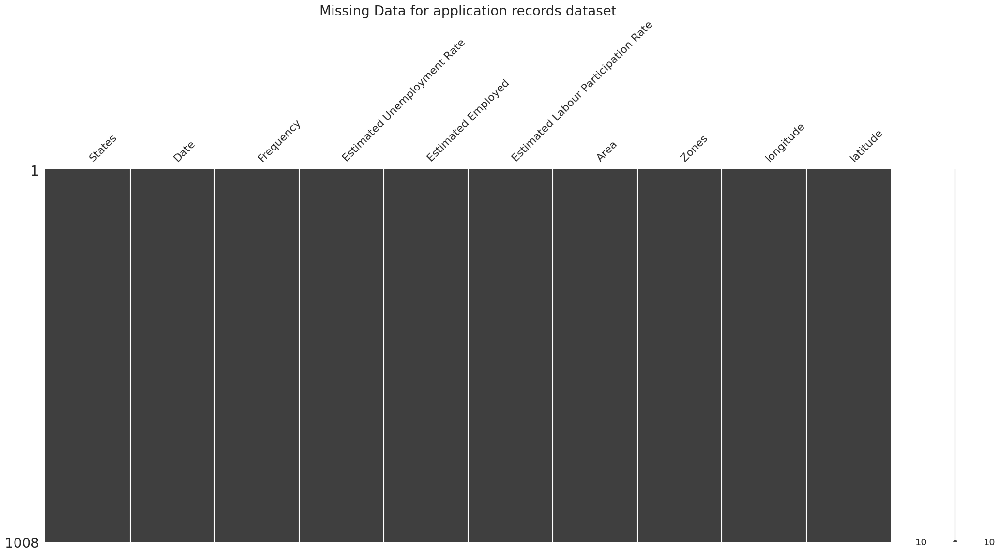

In [581]:
missing = msno.matrix(df3)
missing.set_title("Missing Data for application records dataset", fontsize=20)

In [582]:
print(df3['Area'].value_counts())


Urban    649
Rural    359
Name: Area, dtype: int64


In [583]:
print(df3['Area'].unique())


['Rural' 'Urban']


<Axes: >

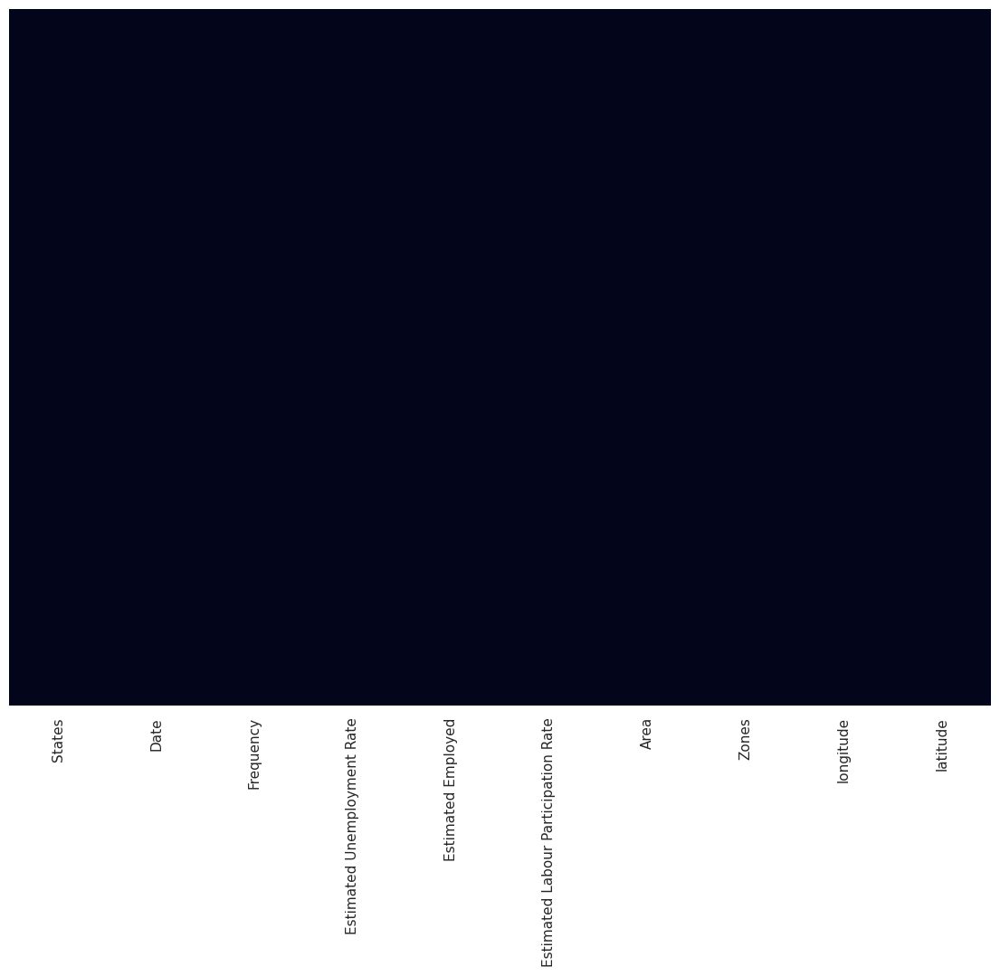

In [584]:
sns.heatmap(df3.isnull(), yticklabels =False, cbar = False )

Now there are no missing values.

Text(0.5, 1.0, 'Missing Data for application records dataset')

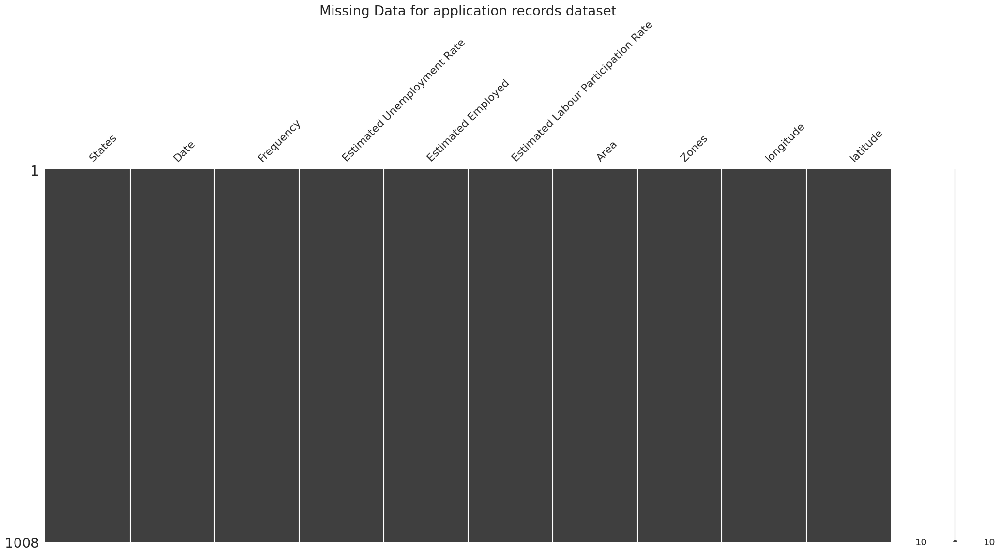

In [585]:
missing = msno.matrix(df3)
missing.set_title("Missing Data for application records dataset", fontsize=20)

# **EDA**

---



In [586]:
df3.describe()

,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,longitude,latitude
count,1008.000000,1.008000e+03,1008.000000,1008.000000,1008.000000
mean,11.895179,8.997034e+06,42.379058,65.247105,80.532425
std,10.740764,1.020280e+07,8.044556,25.679764,2.997258
min,0.000000,4.942000e+04,13.330000,10.850500,71.192400
25%,4.677500,1.643234e+06,37.837500,31.147100,80.532425
50%,8.880000,5.544036e+06,40.880000,80.532425,80.532425
75%,16.117500,1.286249e+07,45.292500,80.532425,80.532425
max,76.740000,5.943376e+07,72.570000,80.532425,92.937600


In [587]:
# Customize the appearance using a color palette
import matplotlib.pyplot as plt
styled_summary = df3.describe().T.style.background_gradient(cmap=("Set1"))

# Display the styled summary
styled_summary

,count,mean,std,min,25%,50%,75%,max
Estimated Unemployment Rate,1008.000000,11.895179,10.740764,0.000000,4.677500,8.880000,16.117500,76.740000
Estimated Employed,1008.000000,8997034.394841,10202802.749974,49420.000000,1643233.500000,5544036.500000,12862486.000000,59433759.000000
Estimated Labour Participation Rate,1008.000000,42.379058,8.044556,13.330000,37.837500,40.880000,45.292500,72.570000
longitude,1008.000000,65.247105,25.679764,10.850500,31.147100,80.532425,80.532425,80.532425
latitude,1008.000000,80.532425,2.997258,71.192400,80.532425,80.532425,80.532425,92.937600


In [588]:
for i in df3:
  print("*************************************",i,
        "**************************************")
  print()
  print(set(df3[i].tolist()))
  print()

************************************* States **************************************

{'Telangana', 'Uttarakhand', 'Assam', 'Goa', 'Himachal Pradesh', 'Meghalaya', 'Uttar Pradesh', 'Gujarat', 'Punjab', 'Andhra Pradesh', 'Haryana', 'West Bengal', 'Maharashtra', 'Tamil Nadu', 'Kerala', 'Karnataka', 'Odisha', 'Sikkim', 'Delhi', 'Jammu & Kashmir', 'Bihar', 'Jharkhand', 'Puducherry', 'Tripura', 'Chandigarh', 'Rajasthan', 'Madhya Pradesh', 'Chhattisgarh'}

************************************* Date **************************************

{' 30-09-2020', ' 31-08-2019', ' 31-07-2020', ' 31-10-2020', ' 31-07-2019', ' 31-01-2020', ' 30-11-2019', ' 30-06-2020', ' 30-06-2019', ' 31-05-2019', ' 31-10-2019', ' 30-09-2019', ' 31-05-2020', ' 31-12-2019', ' 31-08-2020', ' 31-03-2020', ' 30-04-2020', ' 29-02-2020'}

************************************* Frequency **************************************

{' M', 'M'}

************************************* Estimated Unemployment Rate ************************

In [589]:
df3.dtypes

States                                  object
Date                                    object
Frequency                               object
Estimated Unemployment Rate            float64
Estimated Employed                     float64
Estimated Labour Participation Rate    float64
Area                                    object
Zones                                   object
longitude                              float64
latitude                               float64
dtype: object

In [590]:
df3.head()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude
0,Andhra Pradesh,31-05-2019,M,3.65,11999139.0,43.24,Rural,North,80.532425,80.532425
1,Andhra Pradesh,30-06-2019,M,3.05,11755881.0,42.05,Rural,North,80.532425,80.532425
2,Andhra Pradesh,31-07-2019,M,3.75,12086707.0,43.50,Rural,North,80.532425,80.532425
3,Andhra Pradesh,31-08-2019,M,3.32,12285693.0,43.97,Rural,North,80.532425,80.532425
4,Andhra Pradesh,30-09-2019,M,5.17,12256762.0,44.68,Rural,North,80.532425,80.532425


In [591]:
df3.tail()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude
1030,West Bengal,30-06-2020,M,7.29,30726310.0,40.39,Urban,East,22.9868,87.855
1031,West Bengal,31-07-2020,M,6.83,35372506.0,46.17,Urban,East,22.9868,87.855
1032,West Bengal,31-08-2020,M,14.87,33298644.0,47.48,Urban,East,22.9868,87.855
1033,West Bengal,30-09-2020,M,9.35,35707239.0,47.73,Urban,East,22.9868,87.855
1034,West Bengal,31-10-2020,M,9.98,33962549.0,45.63,Urban,East,22.9868,87.855


In [592]:
df3.columns

Index(['States', 'Date', 'Frequency', 'Estimated Unemployment Rate',
       'Estimated Employed', 'Estimated Labour Participation Rate', 'Area',
       'Zones', 'longitude', 'latitude'],
      dtype='object')

In [593]:
# Extract the start and end dates from df2
start_date = df3['Date'].min()
end_date = df3['Date'].max()

In [594]:
start_date

' 29-02-2020'

In [595]:
end_date

' 31-12-2019'

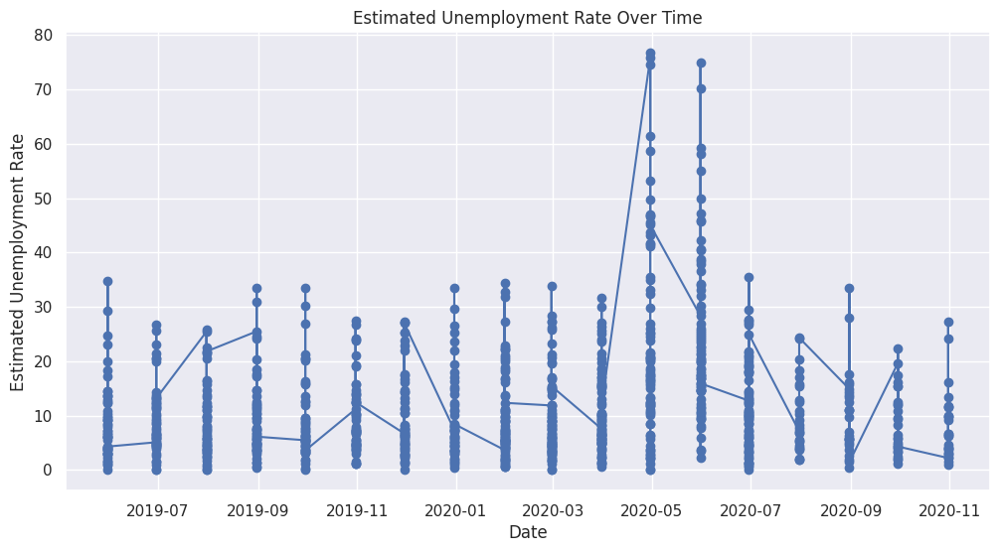

In [596]:
import matplotlib.pyplot as plt

# Assuming df3 is your DataFrame
df3['Date'] = pd.to_datetime(df3['Date'])
df3.sort_values(by='Date', inplace=True)

plt.figure(figsize=(12, 6))
plt.plot(df3['Date'], df3['Estimated Unemployment Rate'], marker='o')
plt.title('Estimated Unemployment Rate Over Time')
plt.xlabel('Date')
plt.ylabel('Estimated Unemployment Rate')
plt.grid(True)
plt.show()


In [597]:
import plotly.express as px

# Assuming df3 is your DataFrame with the required columns
fig = px.scatter(df3, x='Date', y='Estimated Unemployment Rate', color='Zones', size='Estimated Employed',
                 hover_data=['States'], title='Estimated Unemployment Rate with Zones Over Time')

# Update layout for better readability
fig.update_layout(xaxis_title='Date', yaxis_title='Estimated Unemployment Rate', legend_title='Zones')

# Show the interactive plot
fig.show()


In [598]:
!pip install plotly pandas


In [599]:
import plotly.express as px

# Assuming df3 is your DataFrame with the required columns
fig = px.scatter_geo(df3,
                     locations='Zones',
                     locationmode='country names',
                     color='Estimated Unemployment Rate',
                     size='Estimated Employed',
                     hover_name='States',
                     title='Estimated Unemployment Rate Across Zones')

# Update layout for better readability
fig.update_geos(projection_type="natural earth")
fig.update_layout(geo=dict(showframe=False, showcoastlines=False, showland=True))

# Show the interactive plot
fig.show()


In [600]:
import plotly.express as px

# Assuming df3 is your DataFrame with the required columns
fig = px.scatter_geo(df3,
                     locations='States',
                     locationmode='country names',
                     color='Estimated Unemployment Rate',
                     size='Estimated Employed',
                     hover_name='States',
                     title='Estimated Unemployment Rate Across Zones',
                     color_continuous_scale='Jet')

# Update layout for better readability
fig.update_geos(projection_type="natural earth")
fig.update_layout(geo=dict(showframe=False, showcoastlines=False, showland=True))

# Show the interactive plot
fig.show()


In [601]:
import plotly.express as px

# Assuming df3 is your DataFrame with the required columns
fig = px.scatter_geo(df3,
                     locations='Zones',
                     locationmode='country names',
                     color='Estimated Unemployment Rate',
                     size='Estimated Employed',
                     hover_name='States',
                     title='Estimated Unemployment Rate Across Zones',
                     color_continuous_scale='Jet')

# Update layout for better readability
fig.update_geos(projection_type="natural earth", showcoastlines=True, coastlinecolor="Black", showland=True, landcolor="LightGray")

# Update marker style for better visibility
fig.update_traces(marker=dict(line=dict(width=0.5, color='DarkSlateGray')))

# Show the interactive plot
fig.show()


In [602]:
import plotly.express as px

fig = px.scatter(df3,
                 x='Date',
                 y='Estimated Unemployment Rate',
                 size='Estimated Employed',
                 color='Zones',
                 hover_name='States',
                 title='Estimated Unemployment Rate Over Time')

fig.show()


In [603]:
fig = px.bar(df3,
             x='States',
             y='Estimated Employed',
             color='Zones',
             title='Estimated Employed by States')

fig.show()


In [604]:
fig = px.line(df3,
              x='Date',
              y='Estimated Labour Participation Rate',
              color='States',
              title='Estimated Labour Participation Rate Over Time')

fig.show()


In [605]:
import plotly.express as px

fig = px.sunburst(df3,
                  path=['Zones', 'States', 'Frequency'],
                  values='Estimated Employed',
                  title='Sunburst Plot of Estimated Employed by Zones, States, and Frequency')

fig.show()


Convert Date and Month to Month names

---



In [606]:
import pandas as pd

# Assuming 'Date' is in the format 'dd-mm-yyyy'
df3['Date'] = pd.to_datetime(df3['Date'], format='%d-%m-%Y')

# Extract the month and create a new column 'Month'
df3['Month'] = df3['Date'].dt.month

# If you want the month as a string (e.g., 'January', 'February', etc.)
df3['Month_name'] = df3['Date'].dt.strftime('%B')

# Display the updated DataFrame
df3


,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude,Month,Month_name
0,Andhra Pradesh,2019-05-31,M,3.65,11999139.0,43.24,Rural,North,80.532425,80.532425,5,May
698,Telangana,2019-05-31,M,1.52,5560649.0,44.59,Urban,North,80.532425,80.532425,5,May
290,Telangana,2019-05-31,M,2.23,11053353.0,61.74,Rural,North,80.532425,80.532425,5,May
276,Tamil Nadu,2019-05-31,M,0.97,15844698.0,49.44,Rural,North,80.532425,80.532425,5,May
712,Tripura,2019-05-31,M,34.69,423127.0,69.50,Urban,North,80.532425,80.532425,5,May
...,...,...,...,...,...,...,...,...,...,...,...,...
857,Himachal Pradesh,2020-10-31,M,13.46,2123965.0,40.01,Urban,North,31.104800,77.173400,10,October
956,Punjab,2020-10-31,M,9.88,8800430.0,38.75,Urban,North,31.147100,75.341200,10,October
866,Jammu & Kashmir,2020-10-31,M,16.14,3106691.0,35.05,Urban,North,33.778200,76.576200,10,October
916,Maharashtra,2020-10-31,M,4.10,43317881.0,43.75,Urban,West,19.751500,75.713900,10,October


In [607]:
df3.head()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude,Month,Month_name
0,Andhra Pradesh,2019-05-31,M,3.65,11999139.0,43.24,Rural,North,80.532425,80.532425,5,May
698,Telangana,2019-05-31,M,1.52,5560649.0,44.59,Urban,North,80.532425,80.532425,5,May
290,Telangana,2019-05-31,M,2.23,11053353.0,61.74,Rural,North,80.532425,80.532425,5,May
276,Tamil Nadu,2019-05-31,M,0.97,15844698.0,49.44,Rural,North,80.532425,80.532425,5,May
712,Tripura,2019-05-31,M,34.69,423127.0,69.50,Urban,North,80.532425,80.532425,5,May


In [608]:
df3.head()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude,Month,Month_name
0,Andhra Pradesh,2019-05-31,M,3.65,11999139.0,43.24,Rural,North,80.532425,80.532425,5,May
698,Telangana,2019-05-31,M,1.52,5560649.0,44.59,Urban,North,80.532425,80.532425,5,May
290,Telangana,2019-05-31,M,2.23,11053353.0,61.74,Rural,North,80.532425,80.532425,5,May
276,Tamil Nadu,2019-05-31,M,0.97,15844698.0,49.44,Rural,North,80.532425,80.532425,5,May
712,Tripura,2019-05-31,M,34.69,423127.0,69.50,Urban,North,80.532425,80.532425,5,May


In [609]:
df3.columns

Index(['States', 'Date', 'Frequency', 'Estimated Unemployment Rate',
       'Estimated Employed', 'Estimated Labour Participation Rate', 'Area',
       'Zones', 'longitude', 'latitude', 'Month', 'Month_name'],
      dtype='object')

In [610]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig1 = px.scatter(df3,
                  x='States',
                  y='Estimated Unemployment Rate',
                  color='Estimated Unemployment Rate',
                  hover_data=['Estimated Employed', 'Estimated Labour Participation Rate'],
                  title='Estimated Unemployment Rate by States')

fig1.show()


In [611]:
fig2 = px.scatter(df3,
                  x='States',
                  y='Estimated Employed',
                  color='Estimated Employed',
                  hover_data=['Estimated Unemployment Rate', 'Estimated Labour Participation Rate'],
                  title='Estimated Employed by States')

fig2.show()


In [612]:
import plotly.express as px

# Assuming 'States' and 'Estimated Labour Participation Rate' are present in your DataFrame
# Assuming 'Estimated Labour Participation Rate' is numeric

# Drop rows with missing values
df3.dropna(subset=['States', 'Estimated Labour Participation Rate'], inplace=True)

# Create a scatter plot
fig3 = px.scatter(df3,
                  x='States',
                  y='Estimated Labour Participation Rate',
                  color='Estimated Labour Participation Rate',
                  hover_data=['Estimated Unemployment Rate', 'Estimated Employed'],
                  title='Estimated Labour Participation Rate by States')

# Adjust color scale
fig3.update_traces(marker=dict(size=12, showscale=True, colorscale='Viridis'))

fig3.show()


In [613]:
import pandas as pd

# Assuming df3 is your DataFrame
grouped_df = df3.groupby('States').agg({
    'Estimated Unemployment Rate': 'mean',
    'Estimated Employed': 'mean',
    'Estimated Labour Participation Rate': 'mean'
}).reset_index()

# Display the grouped DataFrame
grouped_df.head()


,States,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate
0,Andhra Pradesh,7.589744,1.006147e+07,39.357949
1,Assam,5.991389,6.870190e+06,44.487778
2,Bihar,19.063684,1.532425e+07,37.895789
3,Chandigarh,15.991667,3.168312e+05,39.336667
4,Chhattisgarh,8.866316,5.387143e+06,42.376579


Scatter Plot for Mean Estimated Unemployment Rate by States:

---



In [614]:
import plotly.express as px

fig1 = px.scatter(grouped_df,
                  x='States',
                  y='Estimated Unemployment Rate',
                  color='Estimated Unemployment Rate',
                  title='Mean Estimated Unemployment Rate by States')

fig1.show()


Scatter Plot for Mean Estimated Employed by States:

---



In [615]:
fig2 = px.scatter(grouped_df,
                  x='States',
                  y='Estimated Employed',
                  color='Estimated Employed',
                  title='Mean Estimated Employed by States')

fig2.show()


Scatter Plot for Mean Estimated Labour Participation Rate by States:

---



In [616]:
fig3 = px.scatter(grouped_df,
                  x='States',
                  y='Estimated Labour Participation Rate',
                  color='Estimated Labour Participation Rate',
                  title='Mean Estimated Labour Participation Rate by States')

fig3.show()


In [617]:
import plotly.express as px

fig = px.sunburst(grouped_df,
                  path=['States'],
                  values='Estimated Unemployment Rate',
                  title='Mean Estimated Unemployment Rate by States')

fig.show()


In [618]:
# Sunburst plot for Mean Estimated Employed by States
fig = px.sunburst(grouped_df,
                  path=['States'],
                  values='Estimated Employed',
                  title='Mean Estimated Employed by States')

fig.show()

# Sunburst plot for Mean Estimated Labour Participation Rate by States
fig = px.sunburst(grouped_df,
                  path=['States'],
                  values='Estimated Labour Participation Rate',
                  title='Mean Estimated Labour Participation Rate by States')

fig.show()


In [619]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig = px.bar(df3,
             x='States',
             y=['Estimated Unemployment Rate', 'Estimated Employed', 'Estimated Labour Participation Rate'],
             color='Month_name',
             title='Metrics by States Grouped by Month',
             labels={'value': 'Metric Value', 'variable': 'Metric'},
             facet_col='Month_name',
             facet_col_wrap=3)

fig.show()


In [620]:
import plotly.express as px

# Find the rows with the maximum employment rate for each state
max_employment_rows = df3.loc[df3.groupby('States')['Estimated Employed'].idxmax()]

# Count plot for months with the maximum employment rate
fig1 = px.bar(max_employment_rows,
              x='Month_name',
              title='Count of Max Employment Rate by Month',
              labels={'Month_name': 'Month', 'count': 'Count'},
              color='Month_name')

# Count plot for states with the maximum employment rate
fig2 = px.bar(max_employment_rows,
              x='States',
              title='Count of Max Employment Rate by State',
              labels={'States': 'State', 'count': 'Count'},
              color='States')

# Show the interactive plots
fig1.show()
fig2.show()


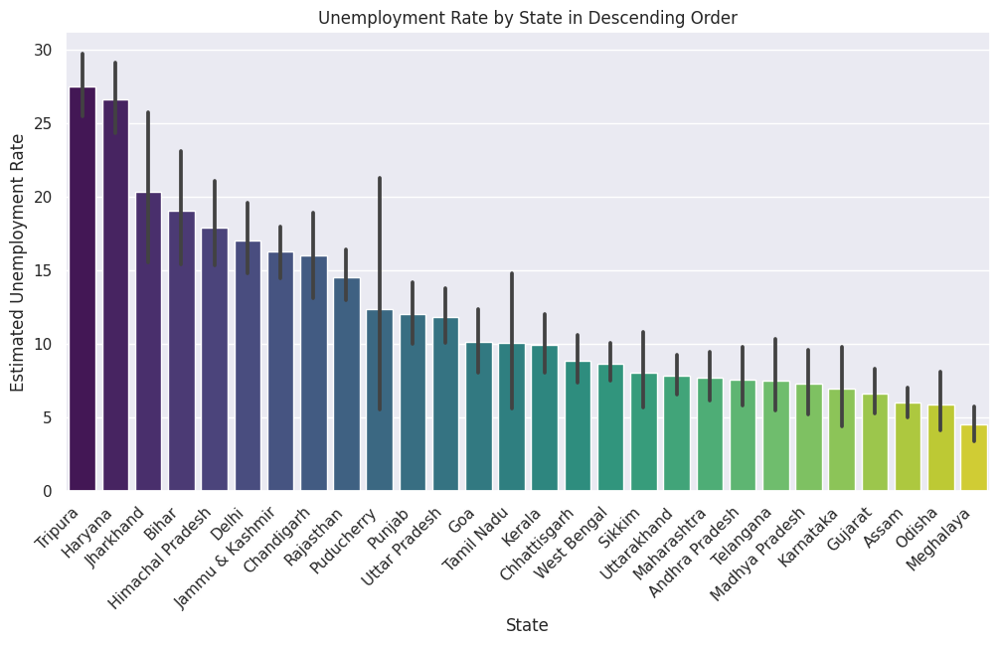

In [621]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df3 is your DataFrame
plt.figure(figsize=(12, 6))
sns.barplot(x='States', y='Estimated Unemployment Rate', data=df3, order=df3.groupby('States')['Estimated Unemployment Rate'].mean().sort_values(ascending=False).index, palette='viridis')
plt.title('Unemployment Rate by State in Descending Order')
plt.xlabel('State')
plt.ylabel('Estimated Unemployment Rate')
plt.xticks(rotation=45, ha='right')
plt.show()


In [622]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig = px.bar(df3,
             x='States',
             y='Estimated Unemployment Rate',
             title='Unemployment Rate by State in Descending Order',
             labels={'Estimated Unemployment Rate': 'Unemployment Rate'},
             category_orders={'States': df3.groupby('States')['Estimated Unemployment Rate'].mean().sort_values(ascending=False).index},
             color='Estimated Unemployment Rate')

fig.show()


Boxplot for employment rate with states and Month

---



In [623]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig = px.box(df3,
             x='Month_name',
             y='Estimated Employed',
             color='States',
             title='Boxplot of Employment Rate by State and Month',
             labels={'Estimated Employed': 'Employment Rate', 'Month_name': 'Month'})

fig.show()


In [624]:
df3.columns

Index(['States', 'Date', 'Frequency', 'Estimated Unemployment Rate',
       'Estimated Employed', 'Estimated Labour Participation Rate', 'Area',
       'Zones', 'longitude', 'latitude', 'Month', 'Month_name'],
      dtype='object')

In [625]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig = px.box(df3,
             x='States',
             y='Estimated Unemployment Rate',
             title='Boxplot of Estimated Unemployment Rate by State',
             labels={'Estimated Unemployment Rate': 'Estimated Unemployment Rate', 'States': 'State'})

fig.show()


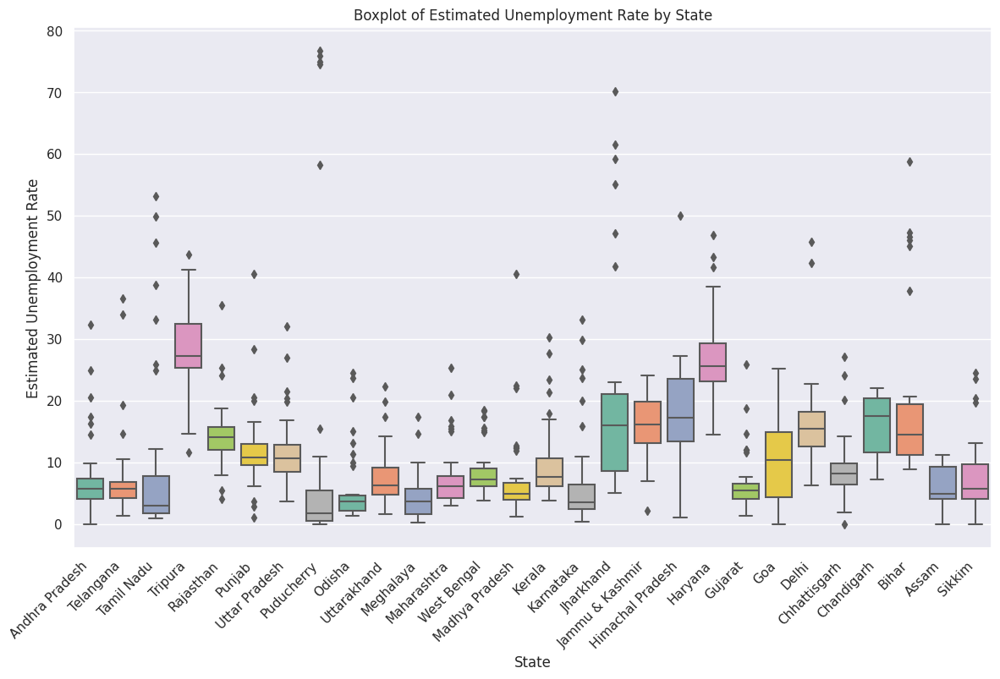

In [626]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df3 is your DataFrame
plt.figure(figsize=(14, 8))
sns.boxplot(x='States', y='Estimated Unemployment Rate', data=df3, palette='Set2')
plt.title('Boxplot of Estimated Unemployment Rate by State')
plt.xlabel('State')
plt.ylabel('Estimated Unemployment Rate')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels
plt.show()


In [627]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig = px.box(df3,
             x='Month_name',
             y='Estimated Unemployment Rate',
             title='Boxplot of Estimated Unemployment Rate by Month',
             labels={'Estimated Unemployment Rate': 'Estimated Unemployment Rate', 'Month_name': 'Month'})

fig.show()


In [628]:
import plotly.express as px

# Assuming 'Month' and 'Estimated Unemployment Rate' are present in your DataFrame
# Assuming 'Month' is in a format recognized as a date or category

# Drop rows with missing values
df3.dropna(subset=['Month', 'Estimated Unemployment Rate'], inplace=True)

# Create a line plot
fig = px.line(df3, x='Month', y='Estimated Unemployment Rate', color='States',
              title='Estimated Unemployment Rate Over Month',
              category_orders={'Month': ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']})

fig.show()


In [629]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig = px.scatter_3d(df3, x='Date', y='Estimated Unemployment Rate', z='Estimated Employed', color='States', title='3D Scatter Plot of Unemployment Rate vs Employed')
fig.show()


In [630]:
import plotly.express as px
import pandas as pd

# Assuming df3 is your DataFrame
df_pivot = df3.pivot_table(index='Date', columns='States', values='Estimated Unemployment Rate', aggfunc='mean')

fig = px.imshow(df_pivot,
                labels={'color': 'Estimated Unemployment Rate'},
                x=df_pivot.columns,
                y=df_pivot.index,
                title='Heatmap of Estimated Unemployment Rate Over Time')
fig.show()


In [631]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig = px.histogram(df3, x='Estimated Unemployment Rate', nbins=30, title='Histogram of Estimated Unemployment Rate')
fig.show()


In [632]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig_unemployment = px.histogram(df3, x='Estimated Unemployment Rate', color='States', title='Histogram of Estimated Unemployment Rate by State')
fig_employed = px.histogram(df3, x='Estimated Employed', color='States', title='Histogram of Estimated Employed by State')
fig_participation = px.histogram(df3, x='Estimated Labour Participation Rate', color='States', title='Histogram of Estimated Labour Participation Rate by State')

fig_unemployment.show()
fig_employed.show()
fig_participation.show()


In [633]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig_violin_unemployment = px.violin(df3, x='States', y='Estimated Unemployment Rate', title='Violin Plot of Estimated Unemployment Rate by State')
fig_violin_unemployment.show()


In [634]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig_violin_employed = px.violin(df3, x='States', y='Estimated Employed', title='Violin Plot of Estimated Employed by State')
fig_violin_employed.show()


In [635]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig_bubble_participation = px.scatter(df3, x='States', y='Estimated Labour Participation Rate', size='Estimated Unemployment Rate', color='States', title='Bubble Plot of Estimated Labour Participation Rate by State')
fig_bubble_participation.show()


In [636]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig_map_unemployment = px.scatter_geo(df3,
                                      lat='latitude',
                                      lon='longitude',
                                      color='Estimated Unemployment Rate',
                                      size='Estimated Unemployment Rate',
                                      hover_name='Zones',
                                      title='Estimated Unemployment Rate by Latitude, Longitude, and Zone',
                                      projection='natural earth',
                                      color_continuous_scale='Viridis')

fig_map_unemployment.show()


In [637]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig = px.scatter_geo(df3,
                     lon='longitude',
                     lat='latitude',
                     color='Area',  # Use a column that exists in your DataFrame
                     hover_name='States',
                     size='Estimated Unemployment Rate',
                     animation_frame='Month_name',
                     scope='asia',
                     template='seaborn',
                     title='Employment across Areas')

# Adjust animation speed
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000

# Set geographical axis ranges and customize map appearance
fig.update_geos(lataxis_range=[5, 35], lonaxis_range=[65, 100], oceancolor="#3399FF", showocean=True)

fig.show()


In [638]:
import plotly.express as px

# Assuming 'States', 'Date', and 'Estimated Unemployment Rate' are present in your df3 DataFrame

# Convert the 'Date' column to datetime if it's not already
df3['Date'] = pd.to_datetime(df3['Date'])

# Filter data for the specified time period (October 2019 to October 2020)
start_date = '2019-10-01'
end_date = '2020-10-31'
filtered_data = df3[(df3['Date'] >= start_date) & (df3['Date'] <= end_date)]

# Create a bar plot
fig = px.bar(filtered_data, x='States', y='Estimated Unemployment Rate',
             title='Unemployment Rate Across Regions (Oct. 2019 to Oct. 2020)',
             labels={'Estimated Unemployment Rate': 'Unemployment Rate (%)'},
             color='States')

# Show the plot
fig.show()


In [639]:
import plotly.express as px

# Assuming 'Zones', 'States', and 'Estimated Unemployment Rate' are present in your df3 DataFrame

# Convert the 'Date' column to datetime if it's not already
df3['Date'] = pd.to_datetime(df3['Date'])

# Filter data for the specified time period (October 2019 to October 2020)
start_date = '2019-10-01'
end_date = '2020-10-31'
filtered_data = df3[(df3['Date'] >= start_date) & (df3['Date'] <= end_date)]

# Create a grouped bar plot
fig = px.bar(filtered_data, x='States', y='Estimated Unemployment Rate',
             title='Unemployment Rate in Each Zone and State (Oct. 2019 to Oct. 2020)',
             labels={'Estimated Unemployment Rate': 'Unemployment Rate (%)'},
             color='Zones',
             barmode='group')

# Show the plot
fig.show()


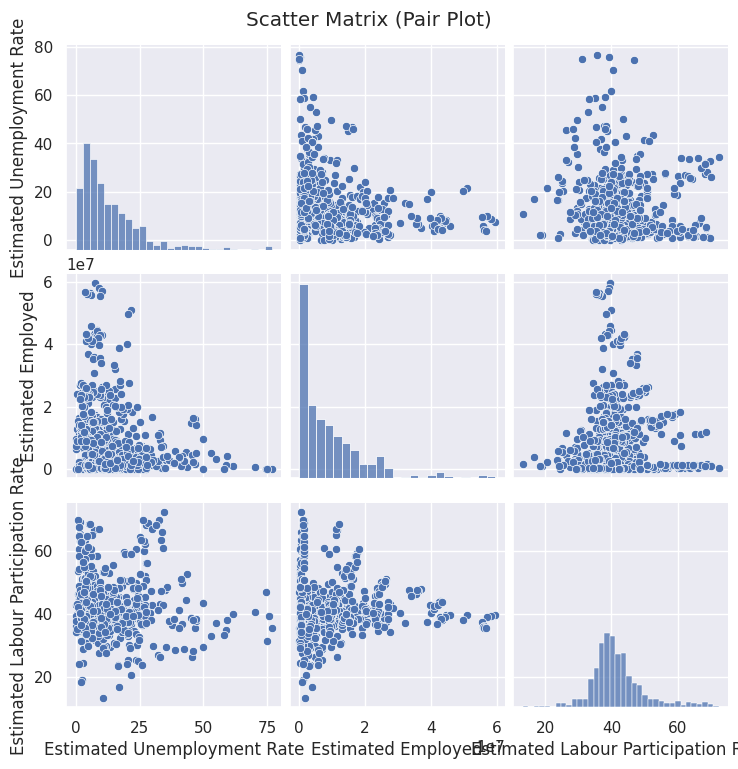

In [640]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'Estimated Unemployment Rate', 'Estimated Employed', and 'Estimated Labour Participation Rate' are present in your df3 DataFrame
# Adjust column names as needed

# Select relevant columns for the pair plot
selected_columns = ['Estimated Unemployment Rate', 'Estimated Employed', 'Estimated Labour Participation Rate']

# Convert the 'Date' column to datetime if it's not already
df3['Date'] = pd.to_datetime(df3['Date'])

# Filter data for the specified time period (October 2019 to October 2020)
start_date = '2019-10-01'
end_date = '2020-10-31'
filtered_data = df3[(df3['Date'] >= start_date) & (df3['Date'] <= end_date)]

# Create a pair plot with tilted x-axis labels
sns.pairplot(filtered_data[selected_columns])
plt.suptitle('Scatter Matrix (Pair Plot)', y=1.02)

# Tilt x-axis labels
plt.xticks(rotation=45, ha='right')

plt.show()


In [641]:
import plotly.express as px

# Convert 'Date' column to string
df3['Date'] = df3['Date'].astype(str)

# Create an animated scatter plot with latitude and longitude
fig = px.scatter_geo(
    df3,
    lat='latitude',
    lon='longitude',
    size='Estimated Unemployment Rate',
    color='Date',
    hover_name='States',
    animation_frame='Date',
    projection='natural earth',
    title='Animated Scatter Plot with Latitude and Longitude'
)

# Show the plot
fig.show()


In [642]:
import plotly.express as px

# Convert 'Date' column to string
df3['Date'] = df3['Date'].astype(str)

# Create an animated scatter plot with latitude and longitude, focusing on India
fig = px.scatter_geo(
    df3,
    lat='latitude',
    lon='longitude',
    size='Estimated Unemployment Rate',
    color='Zones',  # Use 'Zones' for color differentiation
    hover_name='States',
    animation_frame='Date',
    projection='orthographic',
    center=dict(lat=20, lon=77),  # Centered around India
    title='Animated Scatter Plot with Latitude and Longitude (India Projection)',
    labels={'Zones': 'Zones'}
)

# Show the plot
fig.show()


In [643]:
import plotly.express as px

# Assuming df3 is your DataFrame
fig = px.scatter_mapbox(df3,
                        lon='longitude',
                        lat='latitude',
                        color='Zones',
                        hover_name='States',
                        size='Estimated Unemployment Rate',
                        animation_frame='Month_name',
                        template='seaborn',
                        title='Employment across Zones in India')

# Adjust animation speed
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 3000

# Set the Mapbox style and access token
fig.update_layout(mapbox_style="open-street-map",  # You can choose other Mapbox styles
                  mapbox_accesstoken="YOUR_MAPBOX_ACCESS_TOKEN")

fig.show()


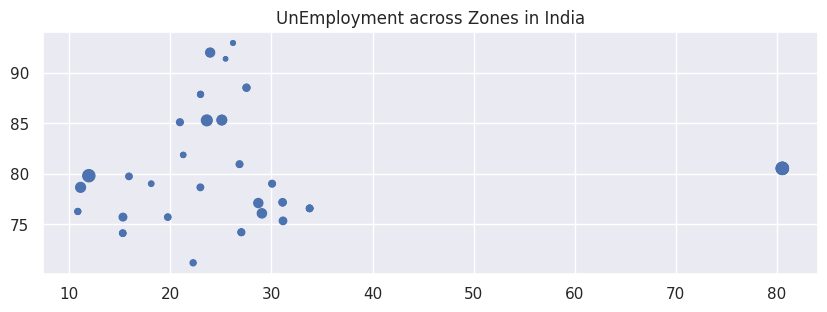

In [644]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df3 is your DataFrame
# Convert latitude and longitude to a GeoDataFrame
gdf = gpd.GeoDataFrame(
    df3,
    geometry=gpd.points_from_xy(df3.longitude, df3.latitude),
)

# Plot the GeoDataFrame
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, markersize='Estimated Unemployment Rate', legend=True)

plt.title('UnEmployment across Zones in India')
plt.show()


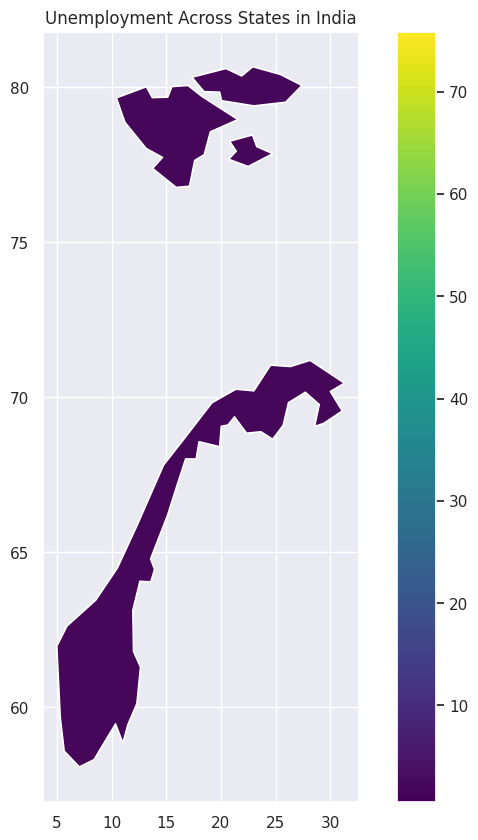

In [645]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from geopandas.tools import geocode

# Assuming df3 is your DataFrame
# Convert latitude and longitude to a GeoDataFrame
gdf_points = gpd.GeoDataFrame(
    df3,
    geometry=gpd.points_from_xy(df3.longitude, df3.latitude),
)

# Read the base map of India
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Merge unemployment data with the base map
gdf_map = gpd.sjoin(world, gdf_points, op='contains')

# Plot unemployment across states
fig, ax = plt.subplots(figsize=(10, 10))
gdf_map.plot(ax=ax, column='Estimated Unemployment Rate', legend=True, cmap='viridis')

plt.title('Unemployment Across States in India')
plt.show()


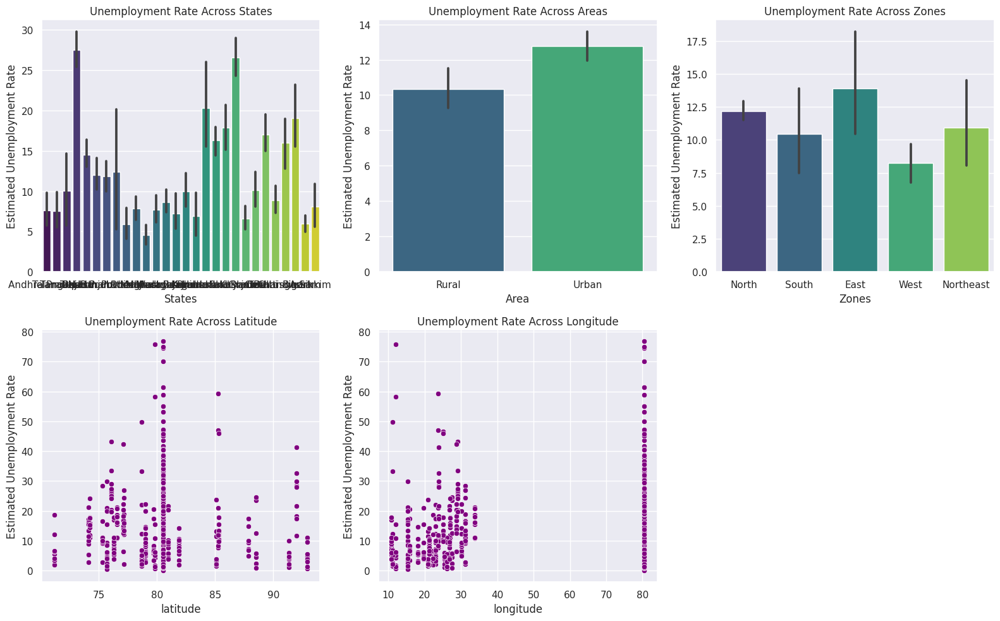

In [646]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df3 is your DataFrame
plt.figure(figsize=(16, 10))

# Plot for Unemployment Rate Across States
plt.subplot(2, 3, 1)
sns.barplot(x='States', y='Estimated Unemployment Rate', data=df3, palette='viridis')
plt.title('Unemployment Rate Across States')

# Plot for Unemployment Rate Across Areas
plt.subplot(2, 3, 2)
sns.barplot(x='Area', y='Estimated Unemployment Rate', data=df3, palette='viridis')
plt.title('Unemployment Rate Across Areas')

# Plot for Unemployment Rate Across Zones
plt.subplot(2, 3, 3)
sns.barplot(x='Zones', y='Estimated Unemployment Rate', data=df3, palette='viridis')
plt.title('Unemployment Rate Across Zones')

# Plot for Unemployment Rate Across Latitude
plt.subplot(2, 3, 4)
sns.scatterplot(x='latitude', y='Estimated Unemployment Rate', data=df3, color='purple')
plt.title('Unemployment Rate Across Latitude')

# Plot for Unemployment Rate Across Longitude
plt.subplot(2, 3, 5)
sns.scatterplot(x='longitude', y='Estimated Unemployment Rate', data=df3, color='purple')
plt.title('Unemployment Rate Across Longitude')

plt.tight_layout()
plt.show()


In [647]:
import geopandas as gpd
import pandas as pd
import plotly.express as px

# Assuming df3 is your DataFrame
# Convert latitude and longitude to a GeoDataFrame
gdf_points = gpd.GeoDataFrame(
    df3,
    geometry=gpd.points_from_xy(df3.longitude, df3.latitude),
)

# Fetch GeoJSON data for Indian states and zones
gdf_states = gpd.tools.geocode("India", provider="nominatim", user_agent="my_geocoder")
gdf_zones = gpd.tools.geocode("India", provider="nominatim", user_agent="my_geocoder")

# Check column names
print("Columns in gdf_states:", gdf_states.columns)
print("Columns in gdf_points:", gdf_points.columns)

# Merge unemployment data with GeoDataFrames
gdf_states = gdf_states.merge(gdf_points, left_on='geometry', right_on='geometry')  # Assuming 'geometry' is the correct column
gdf_zones = gdf_zones.merge(gdf_points, left_on='geometry', right_on='geometry')  # Assuming 'geometry' is the correct column

# Plot Choropleth Map for Unemployment Rate Across States
fig_states = px.choropleth(gdf_states,
                            geojson=gdf_states.geometry,
                            locations=gdf_states.index,
                            color='Estimated Unemployment Rate',
                            hover_name='States',
                            color_continuous_scale='Viridis',
                            title='Unemployment Rate Across States')
fig_states.show()

# Plot Choropleth Map for Unemployment Rate Across Zones
fig_zones = px.choropleth(gdf_zones,
                          geojson=gdf_zones.geometry,
                          locations=gdf_zones.index,
                          color='Estimated Unemployment Rate',
                          hover_name='Zones',
                          color_continuous_scale='Viridis',
                          title='Unemployment Rate Across Zones')
fig_zones.show()

# Scatter Plot for Unemployment Rate Across Latitude
fig_latitude = px.scatter(df3, x='latitude', y='Estimated Unemployment Rate', color='Estimated Unemployment Rate',
                          title='Unemployment Rate Across Latitude')
fig_latitude.show()

# Scatter Plot for Unemployment Rate Across Longitude
fig_longitude = px.scatter(df3, x='longitude', y='Estimated Unemployment Rate', color='Estimated Unemployment Rate',
                           title='Unemployment Rate Across Longitude')
fig_longitude.show()


Columns in gdf_states: Index(['geometry', 'address'], dtype='object')
Columns in gdf_points: Index(['States', 'Date', 'Frequency', 'Estimated Unemployment Rate',
       'Estimated Employed', 'Estimated Labour Participation Rate', 'Area',
       'Zones', 'longitude', 'latitude', 'Month', 'Month_name', 'geometry'],
      dtype='object')


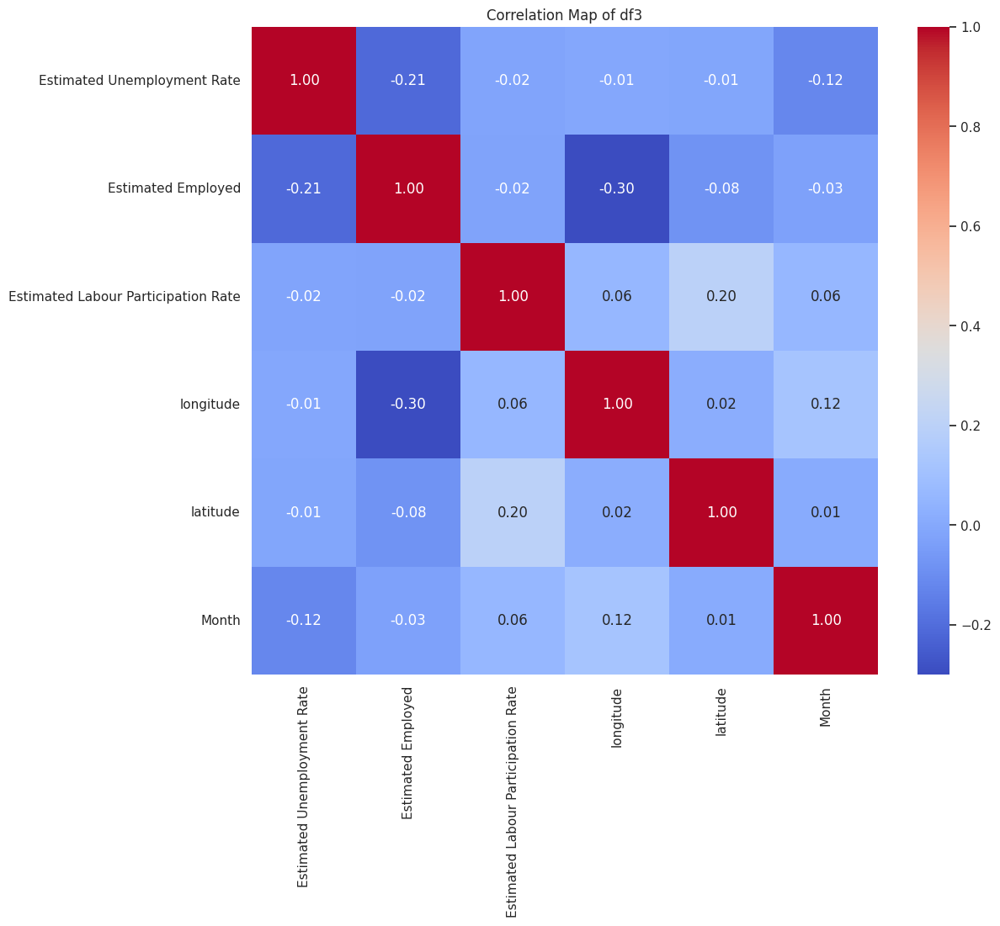

In [648]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df3 is your DataFrame
correlation_matrix = df3.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Map of df3")
plt.show()


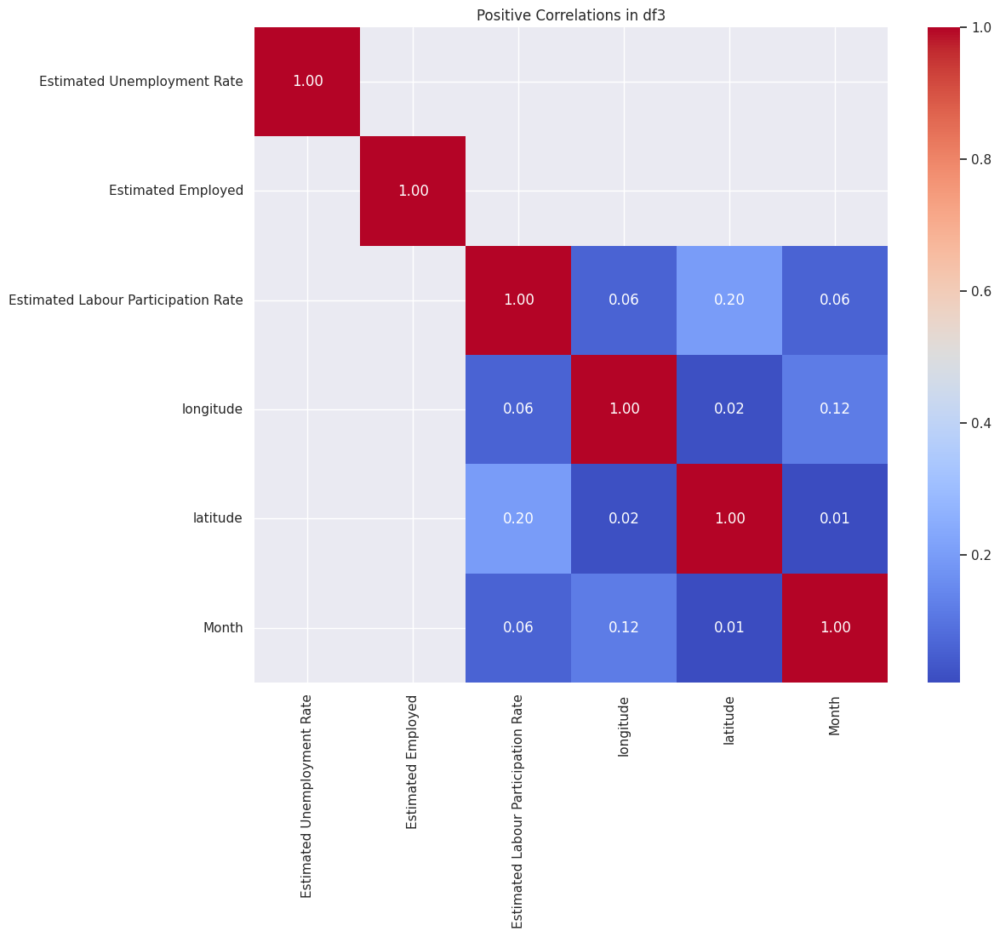

In [649]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df3 is your DataFrame
correlation_matrix = df3.corr()

# Filter only positive correlations
positive_correlations = correlation_matrix[correlation_matrix > 0]

plt.figure(figsize=(12, 10))
sns.heatmap(positive_correlations, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Positive Correlations in df3")
plt.show()


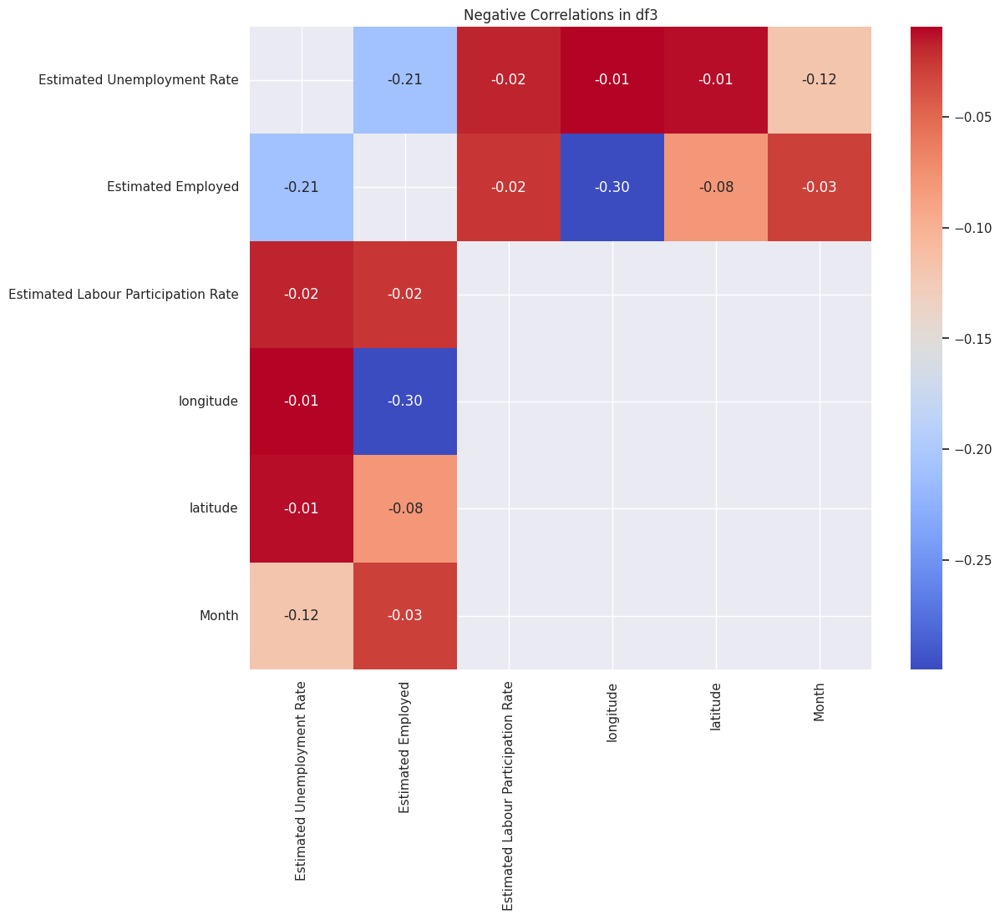

In [650]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df3 is your DataFrame
correlation_matrix = df3.corr()

# Filter only negative correlations
negative_correlations = correlation_matrix[correlation_matrix < 0]

plt.figure(figsize=(12, 10))
sns.heatmap(negative_correlations, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Negative Correlations in df3")
plt.show()


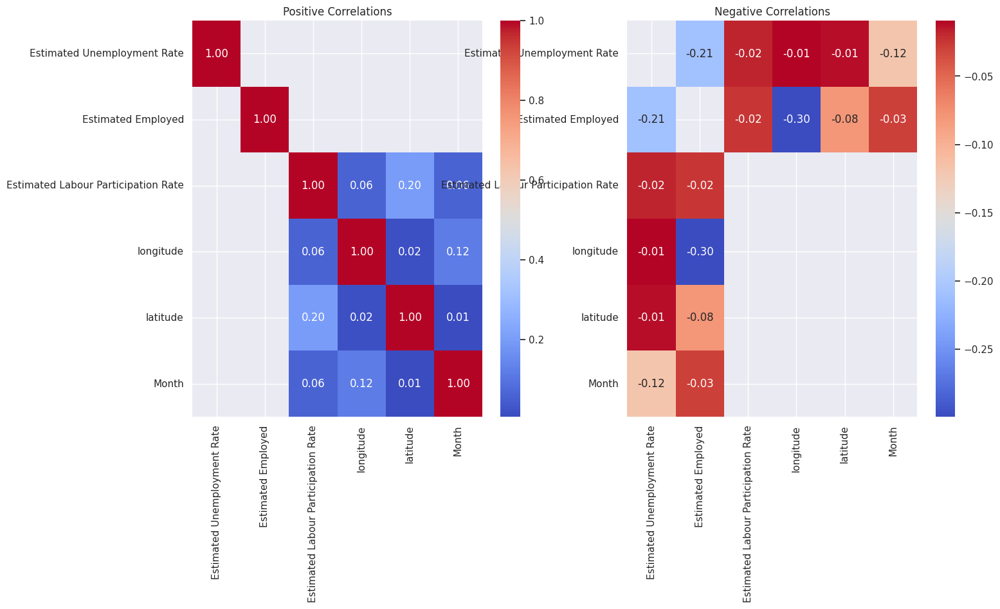

In [651]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df3 is your DataFrame
correlation_matrix = df3.corr()

# Split into positive and negative correlations
positive_correlations = correlation_matrix[correlation_matrix > 0]
negative_correlations = correlation_matrix[correlation_matrix < 0]

# Create subplots with two columns
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot positive correlations
sns.heatmap(positive_correlations, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[0])
axes[0].set_title("Positive Correlations")

# Plot negative correlations
sns.heatmap(negative_correlations, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[1])
axes[1].set_title("Negative Correlations")

plt.show()


In [659]:
df3.columns

Index(['States', 'Date', 'Frequency', 'Estimated Unemployment Rate',
       'Estimated Employed', 'Estimated Labour Participation Rate', 'Area',
       'Zones', 'longitude', 'latitude', 'Month', 'Month_name'],
      dtype='object')

In [660]:
df3.dtypes

States                                  object
Date                                    object
Frequency                               object
Estimated Unemployment Rate            float64
Estimated Employed                     float64
Estimated Labour Participation Rate    float64
Area                                    object
Zones                                   object
longitude                              float64
latitude                               float64
Month                                    int64
Month_name                              object
dtype: object

In [661]:
df3.head()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude,Month,Month_name
0,Andhra Pradesh,2019-05-31,M,3.65,11999139.0,43.24,Rural,North,80.532425,80.532425,5,May
698,Telangana,2019-05-31,M,1.52,5560649.0,44.59,Urban,North,80.532425,80.532425,5,May
290,Telangana,2019-05-31,M,2.23,11053353.0,61.74,Rural,North,80.532425,80.532425,5,May
276,Tamil Nadu,2019-05-31,M,0.97,15844698.0,49.44,Rural,North,80.532425,80.532425,5,May
712,Tripura,2019-05-31,M,34.69,423127.0,69.50,Urban,North,80.532425,80.532425,5,May


In [664]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Assuming df3 is your DataFrame
#df3['States'] = LabelEncoder().fit_transform(df3['States'])
# Convert 'Date' column to datetime type
df3['Date'] = pd.to_datetime(df3['Date'])

# Extract year, month, and day from the 'Date' column
df3['Year'] = df3['Date'].dt.year
df3['Month'] = df3['Date'].dt.month
df3['Day'] = df3['Date'].dt.day

# One-hot encode the extracted features
df3 = pd.get_dummies(df3, columns=['Year', 'Month', 'Day'], drop_first=True)

# Drop the original 'Date' column
df3.drop('Date', axis=1, inplace=True)

# One-hot encode other categorical columns
df3 = pd.get_dummies(df3, columns=['Frequency', 'Area', 'Zones', 'Month_name'], drop_first=True)


In [666]:
df3.head()

,States,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,longitude,latitude,Year_2020,Month_2,Month_3,Month_4,...,Month_name_December,Month_name_February,Month_name_January,Month_name_July,Month_name_June,Month_name_March,Month_name_May,Month_name_November,Month_name_October,Month_name_September
0,Andhra Pradesh,3.65,11999139.0,43.24,80.532425,80.532425,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
698,Telangana,1.52,5560649.0,44.59,80.532425,80.532425,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
290,Telangana,2.23,11053353.0,61.74,80.532425,80.532425,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
276,Tamil Nadu,0.97,15844698.0,49.44,80.532425,80.532425,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
712,Tripura,34.69,423127.0,69.50,80.532425,80.532425,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [667]:
df3.dtypes

States                                  object
Estimated Unemployment Rate            float64
Estimated Employed                     float64
Estimated Labour Participation Rate    float64
longitude                              float64
latitude                               float64
Year_2020                                uint8
Month_2                                  uint8
Month_3                                  uint8
Month_4                                  uint8
Month_5                                  uint8
Month_6                                  uint8
Month_7                                  uint8
Month_8                                  uint8
Month_9                                  uint8
Month_10                                 uint8
Month_11                                 uint8
Month_12                                 uint8
Day_30                                   uint8
Day_31                                   uint8
Frequency_M                              uint8
Area_Urban   

apply standard scaler

---



In [668]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler_columns = ['Estimated Unemployment Rate','Estimated Employed','Estimated Labour Participation Rate','longitude','latitude']
df3[scaler_columns] = scaler.fit_transform(df3[scaler_columns])

In [669]:
df3.head()

,States,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,longitude,latitude,Year_2020,Month_2,Month_3,Month_4,...,Month_name_December,Month_name_February,Month_name_January,Month_name_July,Month_name_June,Month_name_March,Month_name_May,Month_name_November,Month_name_October,Month_name_September
0,Andhra Pradesh,-0.768034,0.294389,0.107075,0.595524,4.743639e-15,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
698,Telangana,-0.966442,-0.336975,0.274974,0.595524,4.743639e-15,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
290,Telangana,-0.900306,0.201645,2.407908,0.595524,4.743639e-15,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
276,Tamil Nadu,-1.017674,0.671488,0.878165,0.595524,4.743639e-15,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
712,Tripura,2.123325,-0.840765,3.373014,0.595524,4.743639e-15,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


**Split x and y**

---



# Split the data into independent and dependent variable

In [670]:
# Features (x) are all columns except the target variable
x = df3.drop(['States','Estimated Unemployment Rate'], axis=1)
# Identify the target variable
y = df3['Estimated Unemployment Rate']

In [671]:
x.head()

,Estimated Employed,Estimated Labour Participation Rate,longitude,latitude,Year_2020,Month_2,Month_3,Month_4,Month_5,Month_6,...,Month_name_December,Month_name_February,Month_name_January,Month_name_July,Month_name_June,Month_name_March,Month_name_May,Month_name_November,Month_name_October,Month_name_September
0,0.294389,0.107075,0.595524,4.743639e-15,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
698,-0.336975,0.274974,0.595524,4.743639e-15,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
290,0.201645,2.407908,0.595524,4.743639e-15,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
276,0.671488,0.878165,0.595524,4.743639e-15,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
712,-0.840765,3.373014,0.595524,4.743639e-15,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0


In [672]:
y.head()

0     -0.768034
698   -0.966442
290   -0.900306
276   -1.017674
712    2.123325
Name: Estimated Unemployment Rate, dtype: float64

In [673]:
x.shape

(1008, 35)

In [674]:
y.shape

(1008,)

Model building

---



In [675]:
from sklearn.model_selection import train_test_split

In [676]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=101)

In [677]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [678]:
lr =LinearRegression()
lr.fit(x_train, y_train)

LinearRegression()

Prediction

---



In [679]:
y_pred_train = lr.predict(x_train)
y_pred_test = lr.predict(x_test)

Evaluation of LR

---



In [680]:
# Evaluate the model on Train data
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)

In [681]:
# Evaluate the model on Test data
mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)

MSE ,R SQUARE ON TEST DATA

---



In [682]:
# Print the evaluation metrics
print(f'Mean Squared Error on test data: {mse_test:.2f}')
print(f'R-squared on test data: {r2_test:.4f}')

# Print the coefficients and intercept
print('Coefficients:', lr.coef_)
print('Intercept:', lr.intercept_)

Mean Squared Error on test data: 0.62
R-squared on test data: 0.2849
Coefficients: [-0.19634682  0.22411475 -2.04274331  0.01827082  0.60336425 -0.22084532
 -0.12002715  0.71485265  0.31201202 -0.16991364 -0.01315798  0.02760502
 -0.1839027   0.02458312 -0.08854964  0.10456946  0.27248668 -0.05164136
  3.87148643  0.29162206  0.53312857 -0.93519721 -1.22248013 -0.87159506
  0.02760502  0.10456946 -0.22084532 -0.38722585 -0.01315798 -0.16991364
 -0.12002715  0.31201202 -0.08854964  0.02458312 -0.1839027 ]
Intercept: -3.7204122542298794


MSE,R -Squared error on train data

---



In [683]:
# Print the evaluation metrics
print(f'Mean Squared Error on train data: {mse_train:.2f}')
print(f'R-squared on train data: {r2_train:.4f}')

# Print the coefficients and intercept
print('Coefficients:', lr.coef_)
print('Intercept:', lr.intercept_)

Mean Squared Error on train data: 0.76
R-squared on train data: 0.2689
Coefficients: [-0.19634682  0.22411475 -2.04274331  0.01827082  0.60336425 -0.22084532
 -0.12002715  0.71485265  0.31201202 -0.16991364 -0.01315798  0.02760502
 -0.1839027   0.02458312 -0.08854964  0.10456946  0.27248668 -0.05164136
  3.87148643  0.29162206  0.53312857 -0.93519721 -1.22248013 -0.87159506
  0.02760502  0.10456946 -0.22084532 -0.38722585 -0.01315798 -0.16991364
 -0.12002715  0.31201202 -0.08854964  0.02458312 -0.1839027 ]
Intercept: -3.7204122542298794


New predictions

---



In [684]:
df3['Predicted Unemployment rate'] = lr.predict(df3[x_test.columns])

In [685]:
df3

,States,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,longitude,latitude,Year_2020,Month_2,Month_3,Month_4,...,Month_name_February,Month_name_January,Month_name_July,Month_name_June,Month_name_March,Month_name_May,Month_name_November,Month_name_October,Month_name_September,Predicted Unemployment rate
0,Andhra Pradesh,-0.768034,0.294389,0.107075,0.595524,4.743639e-15,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0.006278
698,Telangana,-0.966442,-0.336975,0.274974,0.595524,4.743639e-15,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0.459495
290,Telangana,-0.900306,0.201645,2.407908,0.595524,4.743639e-15,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0.540139
276,Tamil Nadu,-1.017674,0.671488,0.878165,0.595524,4.743639e-15,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0.105049
712,Tripura,2.123325,-0.840765,3.373014,0.595524,4.743639e-15,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1.252729
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
857,Himachal Pradesh,0.145762,-0.673980,-0.294638,-1.330201,-1.121256e+00,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0.468302
956,Punjab,-0.187713,-0.019279,-0.451344,-1.328553,-1.732851e+00,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0.290093
866,Jammu & Kashmir,0.395403,-0.577613,-0.911510,-1.226044,-1.320603e+00,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0.094722
916,Maharashtra,-0.726117,3.365534,0.170503,-1.772531,-1.608443e+00,1,0,0,0,...,0,0,0,0,0,0,0,1,0,-0.730657


In [686]:
df3[['States','Predicted Unemployment rate']].head(20)

,States,Predicted Unemployment rate
0,Andhra Pradesh,0.006278
698,Telangana,0.459495
290,Telangana,0.540139
276,Tamil Nadu,0.105049
712,Tripura,1.252729
257,Rajasthan,-0.187412
243,Punjab,0.163284
726,Uttar Pradesh,0.192773
231,Puducherry,0.229528
217,Odisha,-0.054692


<Figure size 1200x600 with 0 Axes>

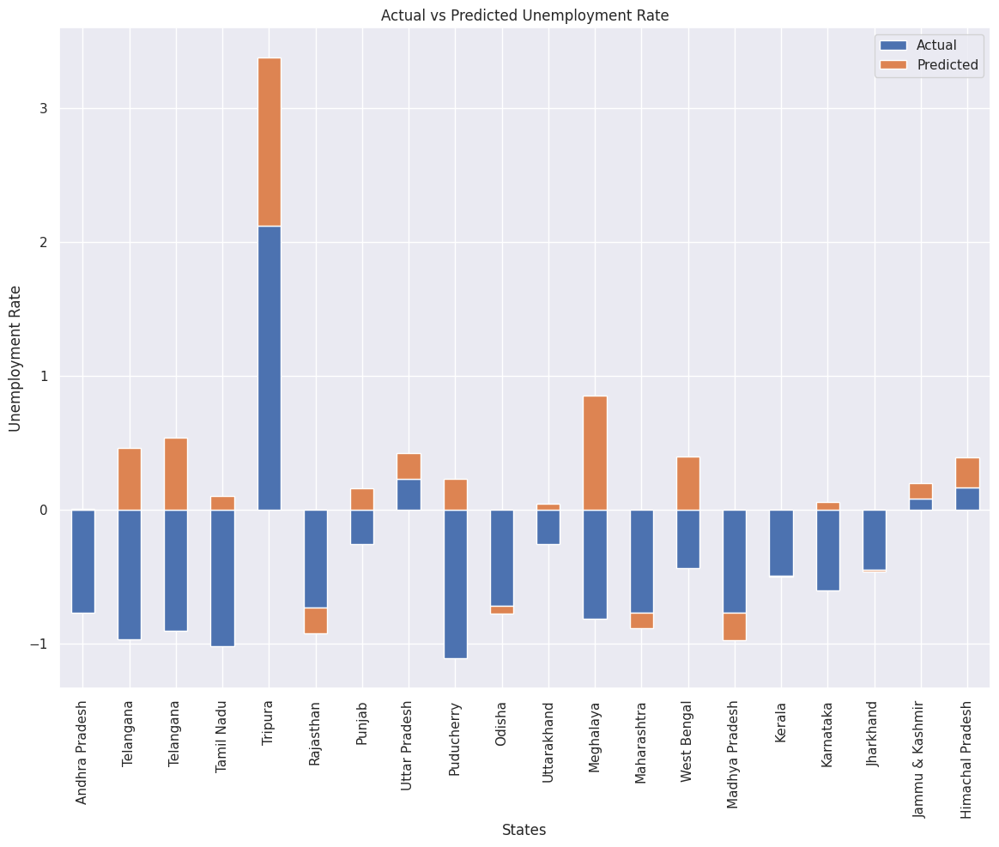

In [687]:
import matplotlib.pyplot as plt

# Assuming df3 is your DataFrame
subset_df = df3[['States', 'Estimated Unemployment Rate', 'Predicted Unemployment rate']].head(20)

# Plotting
plt.figure(figsize=(12, 6))
subset_df.plot(x='States', kind='bar', stacked=True)
plt.title('Actual vs Predicted Unemployment Rate')
plt.xlabel('States')
plt.ylabel('Unemployment Rate')
plt.legend(['Actual', 'Predicted'])
plt.show()


In [688]:
print(df3.columns)

Index(['States', 'Estimated Unemployment Rate', 'Estimated Employed',
       'Estimated Labour Participation Rate', 'longitude', 'latitude',
       'Year_2020', 'Month_2', 'Month_3', 'Month_4', 'Month_5', 'Month_6',
       'Month_7', 'Month_8', 'Month_9', 'Month_10', 'Month_11', 'Month_12',
       'Day_30', 'Day_31', 'Frequency_M', 'Area_Urban', 'Zones_North',
       'Zones_Northeast', 'Zones_South', 'Zones_West', 'Month_name_August',
       'Month_name_December', 'Month_name_February', 'Month_name_January',
       'Month_name_July', 'Month_name_June', 'Month_name_March',
       'Month_name_May', 'Month_name_November', 'Month_name_October',
       'Month_name_September', 'Predicted Unemployment rate'],
      dtype='object')


<Figure size 1200x600 with 0 Axes>

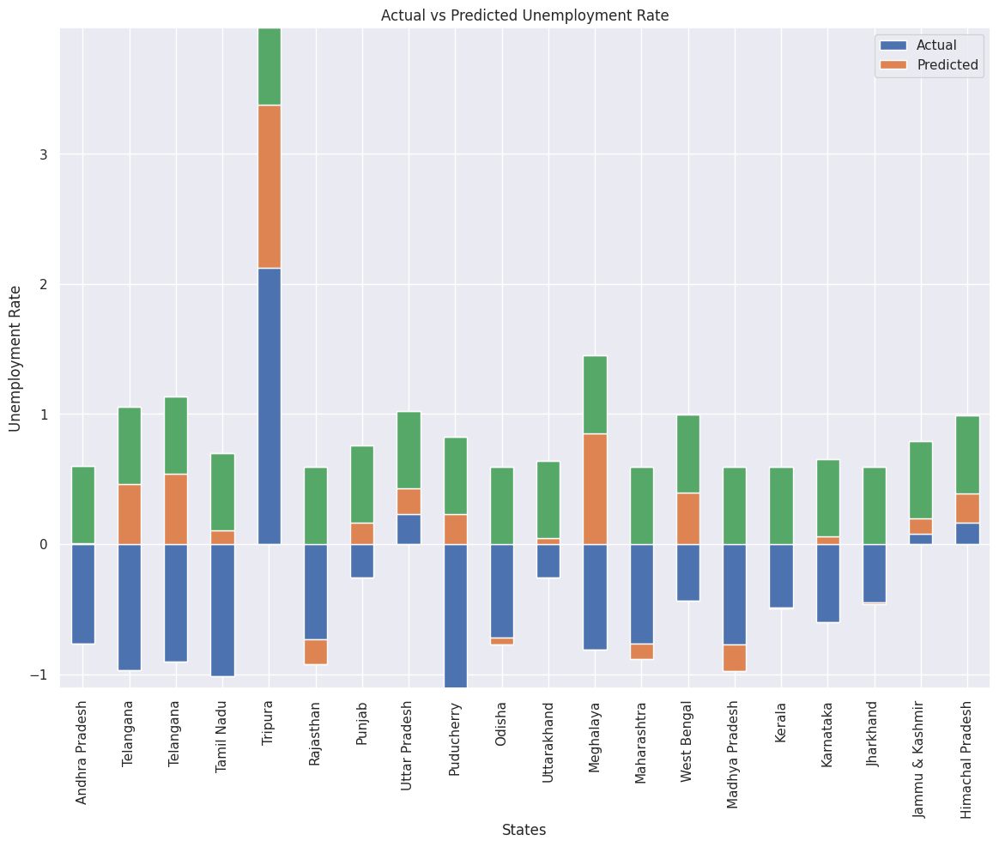

In [689]:
import matplotlib.pyplot as plt

# Assuming df3 is your DataFrame
subset_df = df3[['States', 'Estimated Unemployment Rate', 'Predicted Unemployment rate','longitude','latitude','Year_2020']].head(20)

# Plotting
plt.figure(figsize=(12, 6))
subset_df.plot(x='States', kind='bar', stacked=True)
plt.title('Actual vs Predicted Unemployment Rate')
plt.xlabel('States')
plt.ylabel('Unemployment Rate')
plt.legend(['Actual', 'Predicted'])
plt.show()

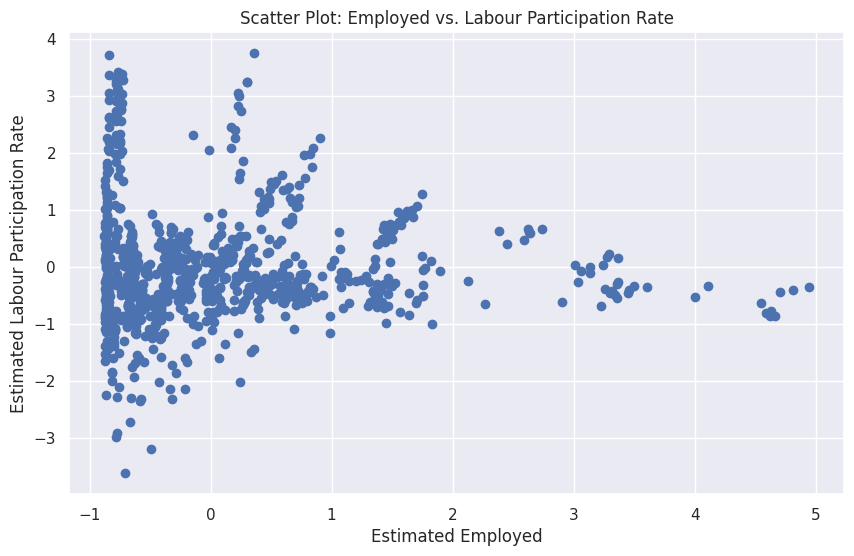

In [690]:
import matplotlib.pyplot as plt

# Assuming df3 is your DataFrame
# Replace 'Estimated Employed' and 'Estimated Labour Participation Rate' with the actual column names you want to plot

plt.figure(figsize=(10, 6))
plt.scatter(df3['Estimated Employed'], df3['Estimated Labour Participation Rate'])
plt.title('Scatter Plot: Employed vs. Labour Participation Rate')
plt.xlabel('Estimated Employed')
plt.ylabel('Estimated Labour Participation Rate')
plt.grid(True)
plt.show()


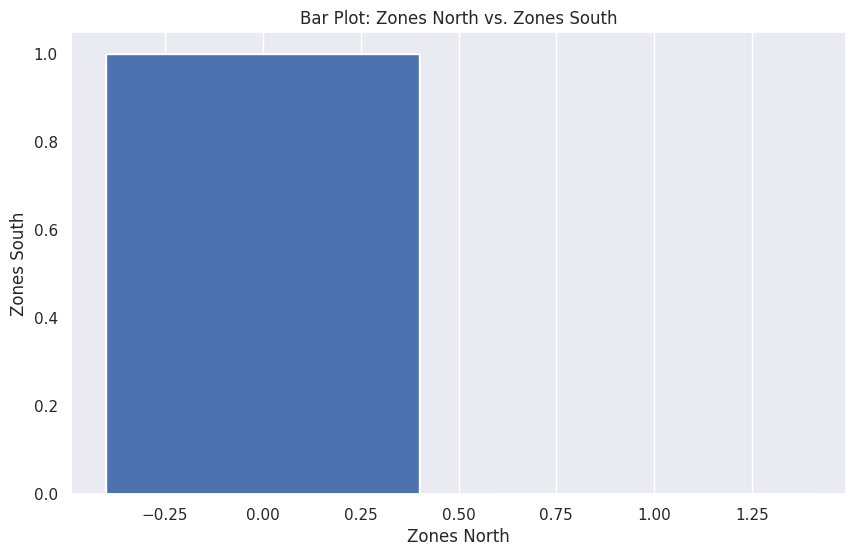

In [691]:
import matplotlib.pyplot as plt

# Assuming df3 is your DataFrame
# Replace 'Zones_North' and 'Zones_South' with the actual column names you want to plot

plt.figure(figsize=(10, 6))
plt.bar(df3['Zones_North'], df3['Zones_South'])
plt.title('Bar Plot: Zones North vs. Zones South')
plt.xlabel('Zones North')
plt.ylabel('Zones South')
plt.grid(axis='y')
plt.show()


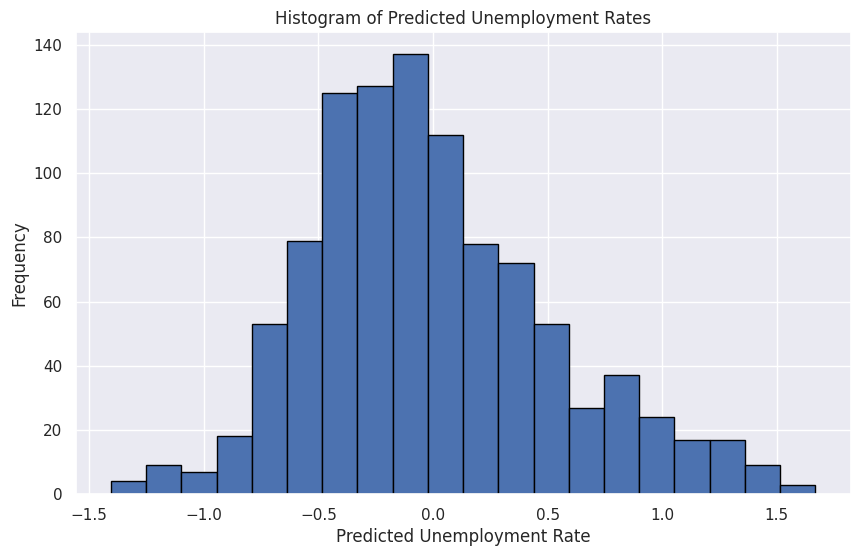

In [692]:
import matplotlib.pyplot as plt

# Assuming df3 is your DataFrame
# Replace 'Predicted Unemployment rate' with the actual column name you want to plot

plt.figure(figsize=(10, 6))
plt.hist(df3['Predicted Unemployment rate'], bins=20, edgecolor='black')
plt.title('Histogram of Predicted Unemployment Rates')
plt.xlabel('Predicted Unemployment Rate')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


In [693]:
import plotly.express as px

# Assuming df3 is your DataFrame
# Replace 'States', 'Estimated Unemployment Rate', 'Month_2', 'Month_3', ..., 'Month_12' with the actual column names you want to plot

# Melt the DataFrame to long format for easier plotting
melted_data = df3.melt(id_vars=['States'],
                       value_vars=['Month_2', 'Month_3', 'Month_4', 'Month_5', 'Month_6', 'Month_7',
                                   'Month_8', 'Month_9', 'Month_10', 'Month_11', 'Month_12'],
                       var_name='Month', value_name='Estimated Unemployment Rate')

# Create an interactive bar chart using Plotly Express
fig = px.bar(melted_data, x='States', y='Estimated Unemployment Rate', color='Month',
             labels={'Estimated Unemployment Rate': 'Unemployment Rate'},
             title='Estimated Unemployment Rate by State and Month',
             barmode='group')

# Show the interactive plot
fig.show()


In [694]:
import plotly.express as px

# Assuming df3 is your DataFrame
# Replace 'States', 'Estimated Unemployment Rate', 'Month_2', 'Month_3', ..., 'Month_12' with the actual column names you want to plot

# Melt the DataFrame to long format for easier plotting
melted_data = df3.melt(id_vars=['States'],
                       value_vars=['Month_2', 'Month_3', 'Month_4', 'Month_5', 'Month_6', 'Month_7',
                                   'Month_8', 'Month_9', 'Month_10', 'Month_11', 'Month_12'],
                       var_name='Month', value_name='Estimated Unemployment Rate')

# Create an interactive sunburst chart using Plotly Express
fig = px.sunburst(melted_data, path=['Month', 'States'], values='Estimated Unemployment Rate',
                  title='Estimated Unemployment Rate by State and Month')

# Show the interactive plot
fig.show()


In [695]:
import plotly.express as px

# Assuming df3 is your DataFrame
# Replace 'States', 'Predicted Unemployment rate', 'Month_2', 'Month_3', ..., 'Month_12' with the actual column names you want to plot

# Melt the DataFrame to long format for easier plotting
melted_data = df3.melt(id_vars=['States'],
                       value_vars=['Month_2', 'Month_3', 'Month_4', 'Month_5', 'Month_6', 'Month_7',
                                   'Month_8', 'Month_9', 'Month_10', 'Month_11', 'Month_12'],
                       var_name='Month', value_name='Predicted Unemployment Rate')

# Create an interactive sunburst chart using Plotly Express
fig = px.sunburst(melted_data, path=['Month', 'States'], values='Predicted Unemployment Rate',
                  title='Predicted Unemployment Rate by State and Month')

# Show the interactive plot
fig.show()


In [696]:
import plotly.express as px

# Assuming df3 is your DataFrame
# Replace 'States', 'latitude', 'longitude', 'Estimated Unemployment Rate', and 'Predicted Unemployment rate'
# with the actual column names you want to plot

# Ensure 'Predicted Unemployment rate' is non-negative
df3['Predicted Unemployment rate'] = df3['Predicted Unemployment rate'].apply(lambda x: max(0, x))

# Create a scatter plot on a geographical map using Plotly Express
fig = px.scatter_geo(df3,
                     lat='latitude', lon='longitude',
                     color='States',
                     size='Predicted Unemployment rate',
                     hover_name='States',
                     title='Predicted Unemployment Rate by State (Geographical Map)',
                     projection='natural earth')

# Show the interactive plot
fig.show()


In [697]:
import plotly.express as px

# Assuming df3 is your DataFrame
# Replace 'Zones_North', 'Zones_Northeast', 'Zones_South', 'Zones_West',
# 'Estimated Unemployment Rate', and 'Predicted Unemployment rate'
# with the actual column names you want to plot

# Melt the DataFrame to long format for easier plotting
melted_data = df3.melt(id_vars=['Zones_North', 'Zones_Northeast', 'Zones_South', 'Zones_West'],
                       value_vars=['Estimated Unemployment Rate', 'Predicted Unemployment rate'],
                       var_name='Rate Type', value_name='Unemployment Rate')

# Create an interactive bar chart using Plotly Express
fig = px.bar(melted_data, x='Rate Type', y='Unemployment Rate', color='Zones_North',
             title='Estimated and Predicted Unemployment Rates by Zone',
             barmode='group', facet_col='Zones_North', labels={'Unemployment Rate': 'Rate'})

# Show the interactive plot
fig.show()


In [698]:
import plotly.express as px

# Assuming df3 is your DataFrame
# Replace 'Zones_North', 'Zones_Northeast', 'Zones_South', 'Zones_West',
# 'Estimated Unemployment Rate', and 'Predicted Unemployment rate'
# with the actual column names you want to plot

# Melt the DataFrame to long format for easier plotting
melted_data = df3.melt(id_vars=['Zones_North', 'Zones_Northeast', 'Zones_South', 'Zones_West'],
                       value_vars=['Estimated Unemployment Rate', 'Predicted Unemployment rate'],
                       var_name='Rate Type', value_name='Unemployment Rate')

# Create an interactive stacked bar chart using Plotly Express
fig = px.bar(melted_data, x='Zones_North', y='Unemployment Rate', color='Rate Type',
             title='Estimated and Predicted Unemployment Rates by Zone',
             barmode='stack', labels={'Unemployment Rate': 'Rate'},
             facet_col='Zones_North')

# Show the interactive plot
fig.show()


In [699]:
df3.columns

Index(['States', 'Estimated Unemployment Rate', 'Estimated Employed',
       'Estimated Labour Participation Rate', 'longitude', 'latitude',
       'Year_2020', 'Month_2', 'Month_3', 'Month_4', 'Month_5', 'Month_6',
       'Month_7', 'Month_8', 'Month_9', 'Month_10', 'Month_11', 'Month_12',
       'Day_30', 'Day_31', 'Frequency_M', 'Area_Urban', 'Zones_North',
       'Zones_Northeast', 'Zones_South', 'Zones_West', 'Month_name_August',
       'Month_name_December', 'Month_name_February', 'Month_name_January',
       'Month_name_July', 'Month_name_June', 'Month_name_March',
       'Month_name_May', 'Month_name_November', 'Month_name_October',
       'Month_name_September', 'Predicted Unemployment rate'],
      dtype='object')

# **USING TIME SERIES FORECASTING**

---



In [700]:
df1 = pd.read_csv('/content/Unemployment in India.csv')
df2= pd.read_csv("/content/Unemployment_Rate_upto_11_2020")

In [701]:
# Remove leading spaces from column names
df1.columns = df1.columns.str.strip()
df2.columns = df2.columns.str.strip()

In [702]:
# Remove leading and trailing whitespaces in 'Frequency' column
df1['Frequency'] = df1['Frequency'].str.strip()

# Replace 'Monthly' with 'M' in df1 in-place
df1['Frequency'].replace('Monthly', 'M', inplace=True)


In [703]:
# Merge the DataFrames on common columns
df3 = pd.merge(df1, df2, on=['Region', 'Date', 'Frequency','Estimated Unemployment Rate (%)',
       'Estimated Employed', 'Estimated Labour Participation Rate (%)'], how='outer')

In [704]:
df3.head()

,Region,Date,Frequency,Estimated Unemployment Rate (%),Estimated Employed,Estimated Labour Participation Rate (%),Area,Region.1,longitude,latitude
0,Andhra Pradesh,31-05-2019,M,3.65,11999139.0,43.24,Rural,NaN,NaN,NaN
1,Andhra Pradesh,30-06-2019,M,3.05,11755881.0,42.05,Rural,NaN,NaN,NaN
2,Andhra Pradesh,31-07-2019,M,3.75,12086707.0,43.50,Rural,NaN,NaN,NaN
3,Andhra Pradesh,31-08-2019,M,3.32,12285693.0,43.97,Rural,NaN,NaN,NaN
4,Andhra Pradesh,30-09-2019,M,5.17,12256762.0,44.68,Rural,NaN,NaN,NaN


In [705]:
df3.columns

Index(['Region', 'Date', 'Frequency', 'Estimated Unemployment Rate (%)',
       'Estimated Employed', 'Estimated Labour Participation Rate (%)', 'Area',
       'Region.1', 'longitude', 'latitude'],
      dtype='object')

In [706]:
# If there are columns with the same name but different values, you may want to rename them
# For example, if ' Estimated Unemployment Rate (%)' is present in both DataFrames
df3.rename(columns={'Region': 'States', 'Estimated Unemployment Rate (%)': 'Estimated Unemployment Rate',
                    'Estimated Labour Participation Rate (%)': 'Estimated Labour Participation Rate',
                    'Region.1': 'Zones'},
           inplace=True)

In [707]:
df3.head()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude
0,Andhra Pradesh,31-05-2019,M,3.65,11999139.0,43.24,Rural,NaN,NaN,NaN
1,Andhra Pradesh,30-06-2019,M,3.05,11755881.0,42.05,Rural,NaN,NaN,NaN
2,Andhra Pradesh,31-07-2019,M,3.75,12086707.0,43.50,Rural,NaN,NaN,NaN
3,Andhra Pradesh,31-08-2019,M,3.32,12285693.0,43.97,Rural,NaN,NaN,NaN
4,Andhra Pradesh,30-09-2019,M,5.17,12256762.0,44.68,Rural,NaN,NaN,NaN


In [708]:
# Fill missing values in the 'Frequency' column with the mode
df3['Frequency'].fillna(df3['Frequency'].mode()[0], inplace=True)

# Display unique values in the 'Frequency' column after filling missing values
print("\nUnique values in 'Frequency' after filling missing values:")
print(df3['Frequency'].unique())


Unique values in 'Frequency' after filling missing values:
['M' ' M']


In [709]:
# If you want to fill NaN values with a specific value, you can use the fillna method
# For example, fill NaN in ' Area, Zones,latitude,longitude' with values With Most frequent ' mean,mode'

df3['Area'].fillna(df3['Area'].mode()[0], inplace=True)
df3['latitude'].fillna(df3['latitude'].mean(),inplace=True)
df3['longitude'].fillna(df3['latitude'].mean(), inplace=True)
df3['Zones'].fillna(df3['Zones'].mode()[0], inplace = True)

df3['States'] = df3['States'].fillna(df3['States'].mode()[0])
df3['Date'] = df3['Date'].fillna(df3['Date'].mode()[0])
df3['Estimated Unemployment Rate'] = df3['Estimated Unemployment Rate'].fillna(df3['Estimated Unemployment Rate'].mode()[0])
df3['Estimated Employed'] = df3['Estimated Employed'].fillna(df3['Estimated Employed'].mode()[0])
df3['Estimated Labour Participation Rate'] = df3['Estimated Labour Participation Rate'].fillna(df3['Estimated Labour Participation Rate'].mode()[0])



In [710]:
df3['Estimated Unemployment Rate'].fillna(df3['Estimated Unemployment Rate'].mean(), inplace=True)


In [711]:
df3= df3.drop_duplicates(subset=df3.columns[1:], keep='first')

In [712]:
df3.head()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude
0,Andhra Pradesh,31-05-2019,M,3.65,11999139.0,43.24,Rural,North,80.532425,80.532425
1,Andhra Pradesh,30-06-2019,M,3.05,11755881.0,42.05,Rural,North,80.532425,80.532425
2,Andhra Pradesh,31-07-2019,M,3.75,12086707.0,43.50,Rural,North,80.532425,80.532425
3,Andhra Pradesh,31-08-2019,M,3.32,12285693.0,43.97,Rural,North,80.532425,80.532425
4,Andhra Pradesh,30-09-2019,M,5.17,12256762.0,44.68,Rural,North,80.532425,80.532425


In [713]:
df3.columns

Index(['States', 'Date', 'Frequency', 'Estimated Unemployment Rate',
       'Estimated Employed', 'Estimated Labour Participation Rate', 'Area',
       'Zones', 'longitude', 'latitude'],
      dtype='object')

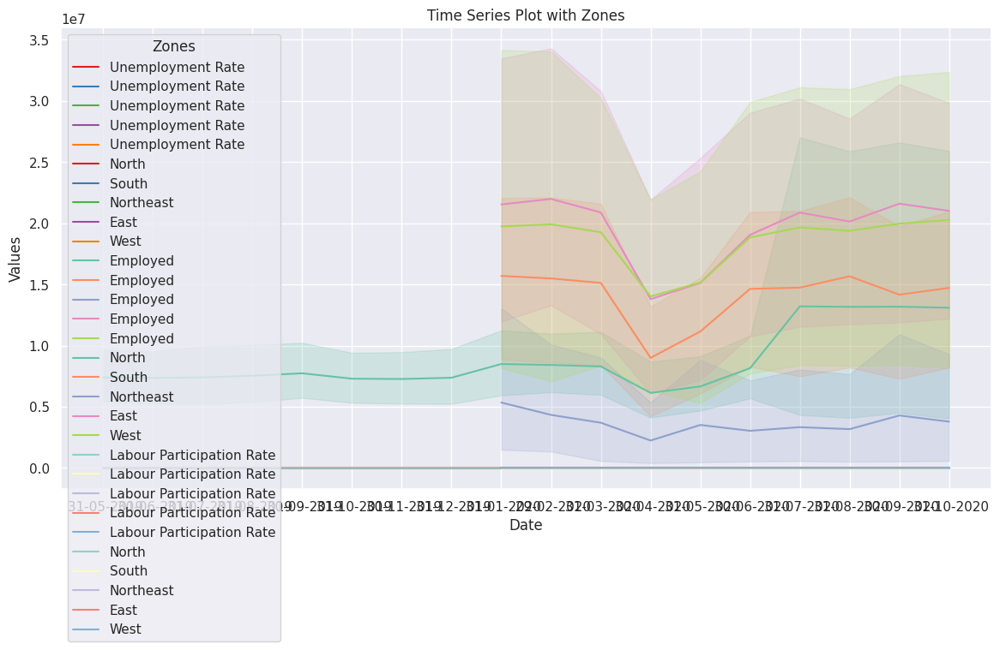

In [714]:
# Plotting using seaborn lineplot
plt.figure(figsize=(14, 7))
sns.lineplot(x='Date', y='Estimated Unemployment Rate', hue='Zones', data=df3, label='Unemployment Rate', palette='Set1')
sns.lineplot(x='Date', y='Estimated Employed', hue='Zones', data=df3, label='Employed', palette='Set2')
sns.lineplot(x='Date', y='Estimated Labour Participation Rate', hue='Zones', data=df3, label='Labour Participation Rate', palette='Set3')

plt.title('Time Series Plot with Zones')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend(title='Zones')
plt.show()

In [715]:
# Line plot with zones
fig = px.line(df3, x='Date', y=['Estimated Unemployment Rate', 'Estimated Employed', 'Estimated Labour Participation Rate'],
              color='Zones', labels={'value': 'Values'}, title='Time Series Plot with Zones')
fig.show()

# Area plot with zones
fig_area = px.area(df3, x='Date', y=['Estimated Unemployment Rate', 'Estimated Employed', 'Estimated Labour Participation Rate'],
                   color='Zones', labels={'value': 'Values'}, title='Area Plot with Zones')
fig_area.show()

# Scatter plot for Unemployment Rate and Employed
fig_scatter = px.scatter(df3, x='Date', y='Estimated Unemployment Rate', color='Zones',
                         size='Estimated Employed', labels={'Estimated Unemployment Rate': 'Unemployment Rate', 'Estimated Employed': 'Employed'},
                         title='Scatter Plot: Unemployment Rate vs Employed')
fig_scatter.show()

# Box plot for each zone
fig_box = px.box(df3, x='Zones', y='Estimated Unemployment Rate', labels={'Estimated Unemployment Rate': 'Unemployment Rate'},
                 title='Box Plot: Unemployment Rate by Zone')
fig_box.show()

# Heatmap
# Create a heatmap using Plotly express
fig_heatmap = px.imshow(df3.groupby(['Date', 'Zones'])['Estimated Unemployment Rate'].mean().unstack(),
                        labels={'color': 'Unemployment Rate'},
                        title='Heatmap: Unemployment Rate by Zone over Time')
fig_heatmap.show()

In [716]:
import pandas as pd

# Assuming 'States' and 'Estimated Unemployment Rate' are present in your DataFrame
average_unemployment_by_state = df3.groupby('States')['Estimated Unemployment Rate'].mean().reset_index()

# Display the average unemployment rate in each state
print(average_unemployment_by_state)


              States  Estimated Unemployment Rate
0     Andhra Pradesh                     7.589744
1              Assam                     5.991389
2              Bihar                    19.063684
3         Chandigarh                    15.991667
4       Chhattisgarh                     8.866316
5              Delhi                    17.000263
6                Goa                    10.125000
7            Gujarat                     6.588158
8            Haryana                    26.597368
9   Himachal Pradesh                    17.888947
10   Jammu & Kashmir                    16.275333
11         Jharkhand                    20.309737
12         Karnataka                     6.937105
13            Kerala                     9.942368
14    Madhya Pradesh                     7.261053
15       Maharashtra                     7.668421
16         Meghalaya                     4.546757
17            Odisha                     5.869474
18        Puducherry                    12.361389


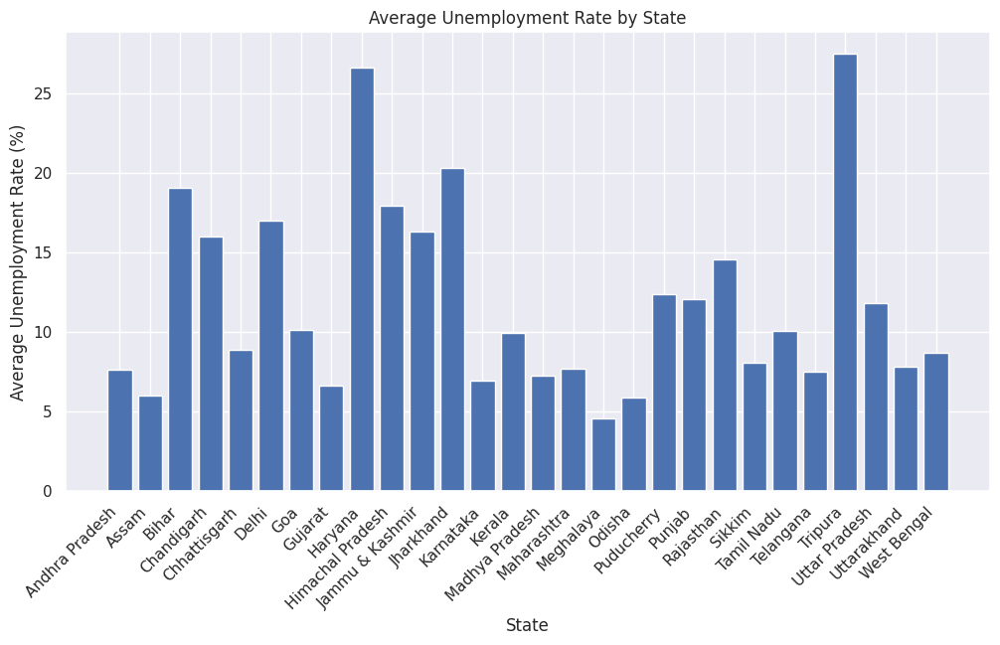

In [717]:
import matplotlib.pyplot as plt

# Plotting average unemployment rate by state
plt.figure(figsize=(12, 6))
plt.bar(average_unemployment_by_state['States'], average_unemployment_by_state['Estimated Unemployment Rate'])
plt.title('Average Unemployment Rate by State')
plt.xlabel('State')
plt.ylabel('Average Unemployment Rate (%)')
plt.xticks(rotation=45, ha='right')
plt.show()


In [718]:
import plotly.express as px

# Assuming 'States' and 'Estimated Unemployment Rate' are present in your DataFrame
average_unemployment_by_state = df3.groupby('States')['Estimated Unemployment Rate'].mean().reset_index()

# Create a bar plot with different colors for each state using Plotly express
fig_bar_colored = px.bar(average_unemployment_by_state, x='States', y='Estimated Unemployment Rate',
                         color='States',  # Different colors for each state
                         labels={'Estimated Unemployment Rate': 'Average Unemployment Rate (%)'},
                         title='Average Unemployment Rate by State with Different Colors')
fig_bar_colored.update_layout(xaxis=dict(type='category'))  # Ensure 'States' are treated as categorical
fig_bar_colored.show()


In [719]:
import plotly.express as px

# Assuming 'States' and 'Estimated Unemployment Rate' are present in your DataFrame
average_unemployment_by_state = df3.groupby('States')['Estimated Unemployment Rate'].mean().reset_index()

# Sort the DataFrame in descending order based on the average unemployment rate
average_unemployment_by_state_sorted = average_unemployment_by_state.sort_values(by='Estimated Unemployment Rate', ascending=False)

# Create a bar plot with different colors for each state and in descending order using Plotly express
fig_bar_colored_sorted = px.bar(average_unemployment_by_state_sorted, x='States', y='Estimated Unemployment Rate',
                                color='States',  # Different colors for each state
                                labels={'Estimated Unemployment Rate': 'Average Unemployment Rate (%)'},
                                title='Average Unemployment Rate by State (Descending Order)')
fig_bar_colored_sorted.update_layout(xaxis=dict(type='category'))  # Ensure 'States' are treated as categorical
fig_bar_colored_sorted.show()


In [720]:
import pandas as pd

# Assuming 'Date' column is not in datetime format
df3['Date'] = pd.to_datetime(df3['Date'])

# Extract year, month, and day
df3['Year'] = df3['Date'].dt.year
df3['Month'] = df3['Date'].dt.month
df3['Day'] = df3['Date'].dt.day


In [721]:
# Find the start and end dates in the DataFrame
start_date = df3['Date'].min()
end_date = df3['Date'].max()

print(f"Start Date: {start_date}")
print(f"End Date: {end_date}")

Start Date: 2019-05-31 00:00:00
End Date: 2020-10-31 00:00:00


In [722]:
# Find the start and end dates in the DataFrame
start_date = df3['Date'].min()
end_date = df3['Date'].max()

# Filter DataFrame for the start and end dates
start_date_data = df3[df3['Date'] == start_date]
end_date_data = df3[df3['Date'] == end_date]

# Display unemployment rate for start and end dates
print(f"Unemployment Rate on Start Date ({start_date}): {start_date_data['Estimated Unemployment Rate'].values[0]}%")
print(f"Unemployment Rate on End Date ({end_date}): {end_date_data['Estimated Unemployment Rate'].values[0]}%")


Unemployment Rate on Start Date (2019-05-31 00:00:00): 3.65%
Unemployment Rate on End Date (2020-10-31 00:00:00): 6.59%


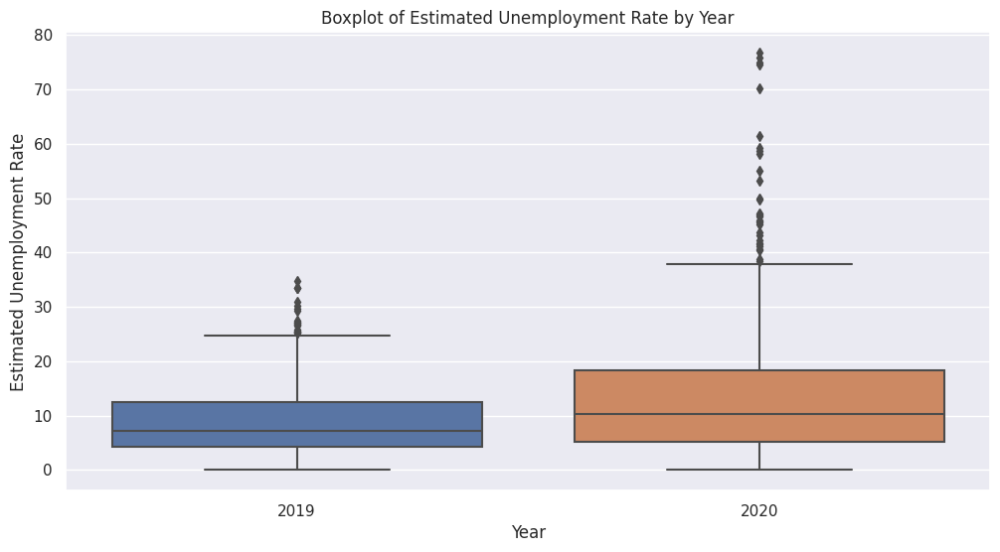

In [723]:
# Create a boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year', y='Estimated Unemployment Rate', data=df3)
plt.title('Boxplot of Estimated Unemployment Rate by Year')
plt.xlabel('Year')
plt.ylabel('Estimated Unemployment Rate')
plt.show()

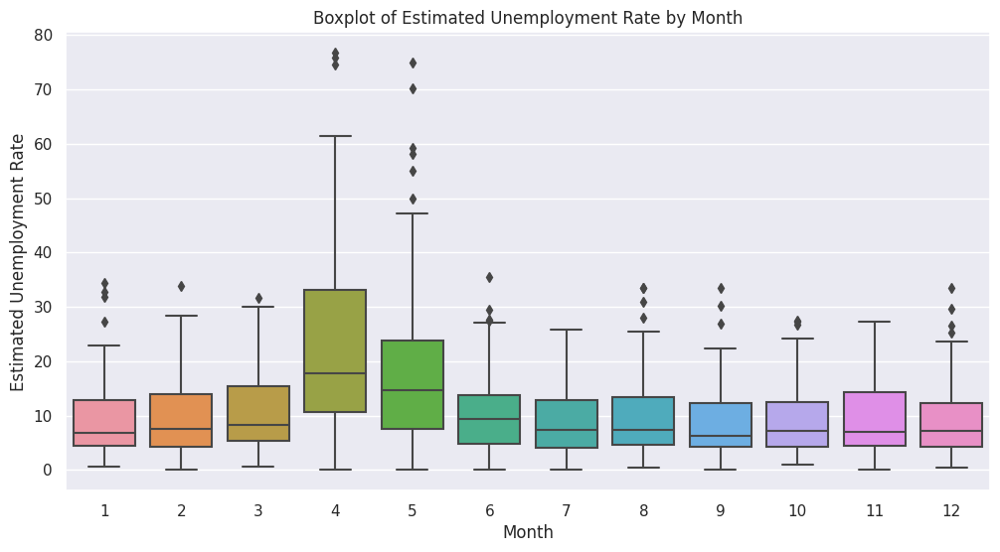

In [724]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Month', y='Estimated Unemployment Rate', data=df3)
plt.title('Boxplot of Estimated Unemployment Rate by Month')
plt.xlabel('Month')
plt.ylabel('Estimated Unemployment Rate')
plt.show()


In [725]:
from statsmodels.tsa.seasonal import seasonal_decompose

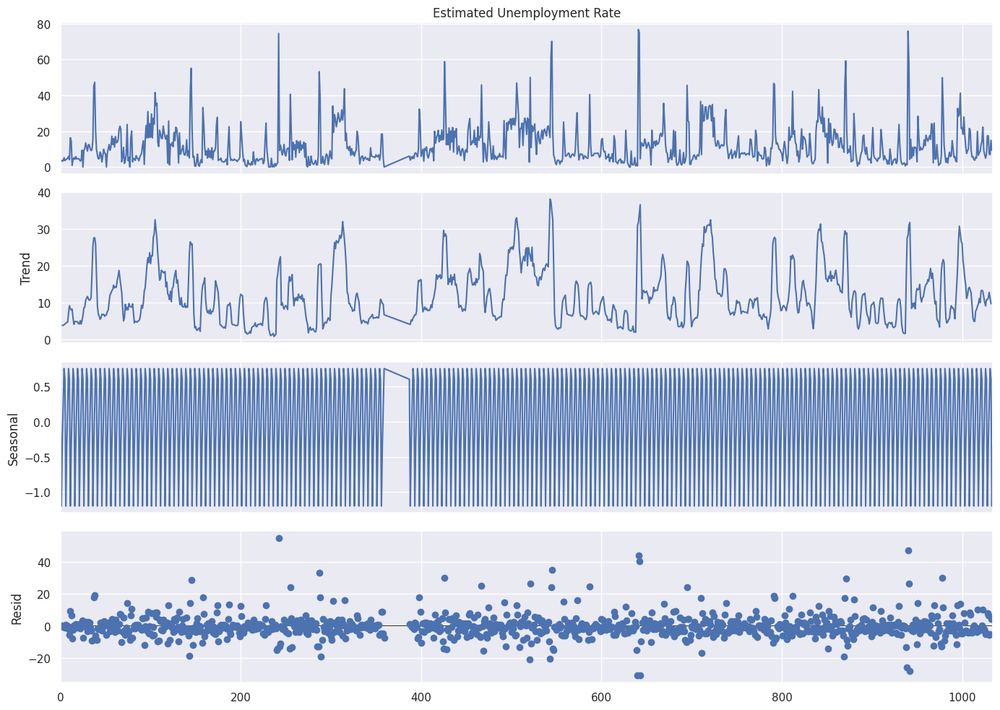

In [726]:
# Perform seasonal decomposition with an additive model
decompostion = seasonal_decompose(df3['Estimated Unemployment Rate'], period=5, model = 'additive')
decompostion.plot();
plt.show()


In [727]:
df3['Estimated Unemployment Rate'] = df3['Estimated Unemployment Rate'] + 1  # Adding a constant value

df3['Estimated Unemployment Rate'] = np.log1p(df3['Estimated Unemployment Rate'])  # Logarithmic transformation


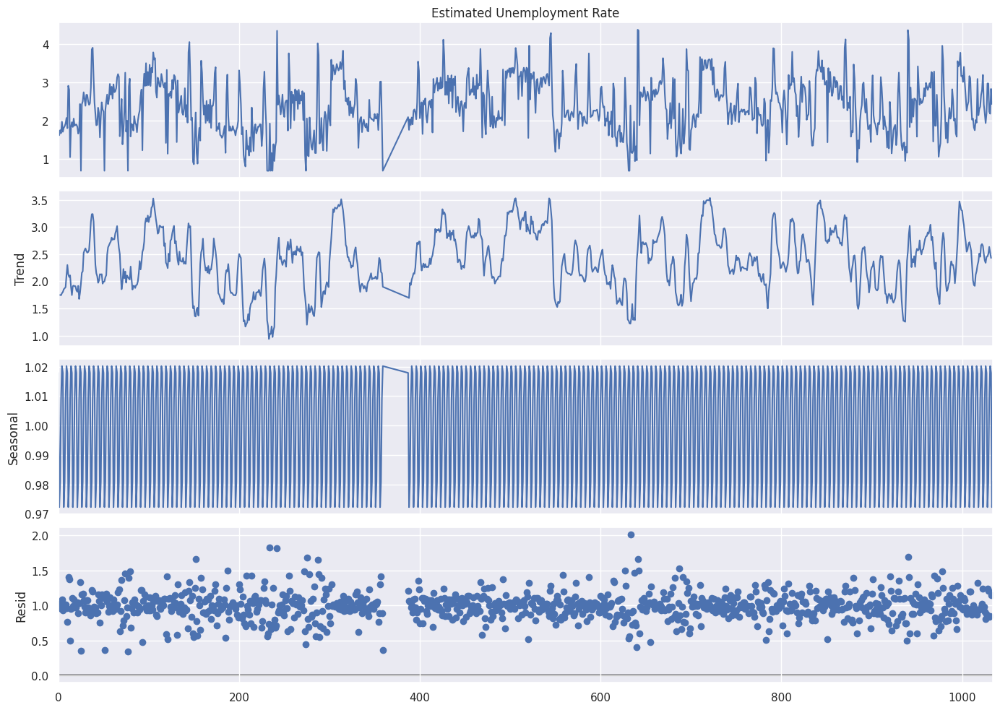

In [728]:
decomposition = seasonal_decompose(df3['Estimated Unemployment Rate'], period=5, model='multiplicative')
decomposition.plot()
plt.show()


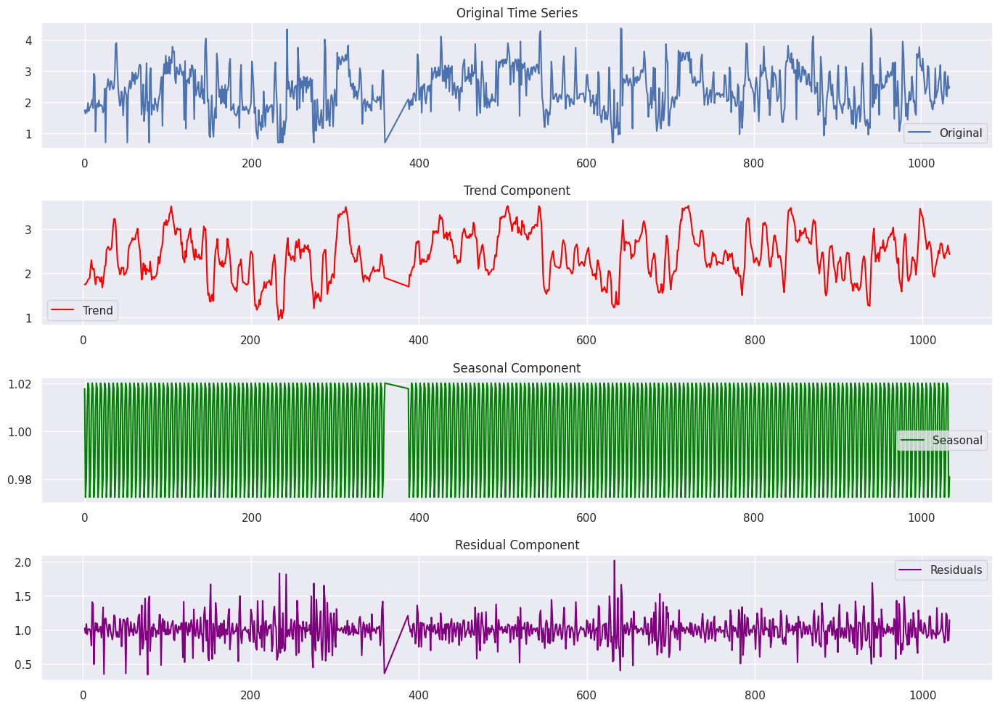

In [729]:
import matplotlib.pyplot as plt
import seaborn as sns

# Increase the default figure size and font size
plt.rcParams['figure.figsize'] = (14, 10)
plt.rcParams['font.size'] = 14

# Perform seasonal decomposition with a multiplicative model
decomposition = seasonal_decompose(df3['Estimated Unemployment Rate'], period=5, model='multiplicative')

# Plot the decomposition components
plt.figure(figsize=(14, 10))

# Original Time Series
plt.subplot(4, 1, 1)
plt.plot(df3['Estimated Unemployment Rate'], label='Original')
plt.title('Original Time Series')
plt.legend()

# Trend Component
plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.title('Trend Component')
plt.legend()

# Seasonal Component
plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Seasonal', color='green')
plt.title('Seasonal Component')
plt.legend()

# Residual Component
plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residuals', color='purple')
plt.title('Residual Component')
plt.legend()

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


DECOMPOSITION GRAPH FOR ADDITIVE

---



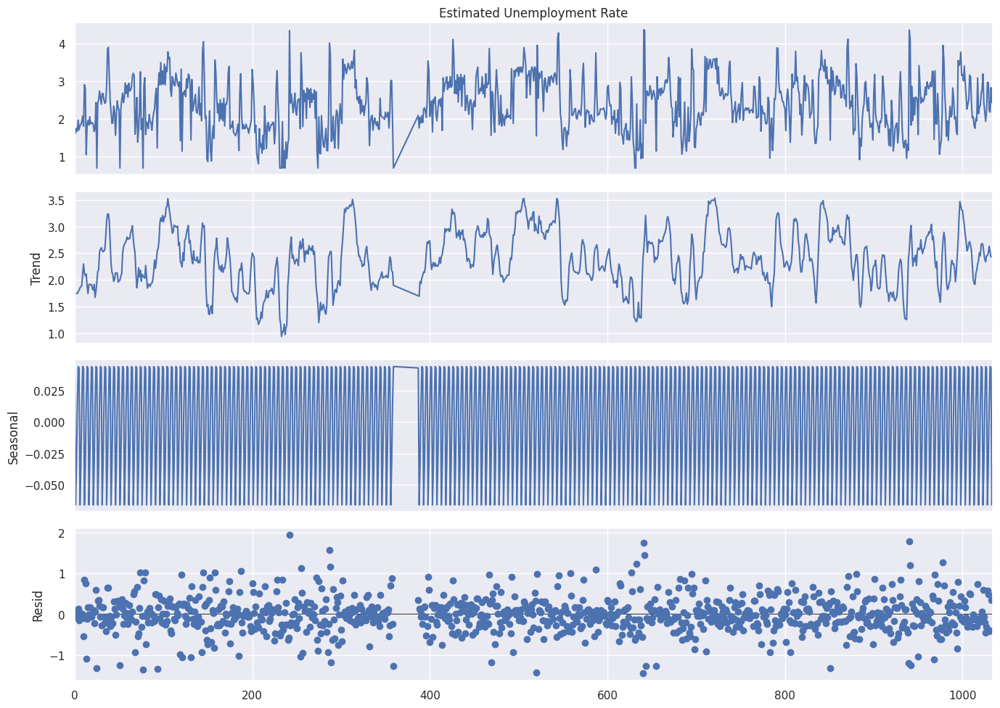

In [730]:
# Perform seasonal decomposition with an additive model
decompostion = seasonal_decompose(df3['Estimated Unemployment Rate'], period=5, model = 'additive')
decompostion.plot();
plt.show()

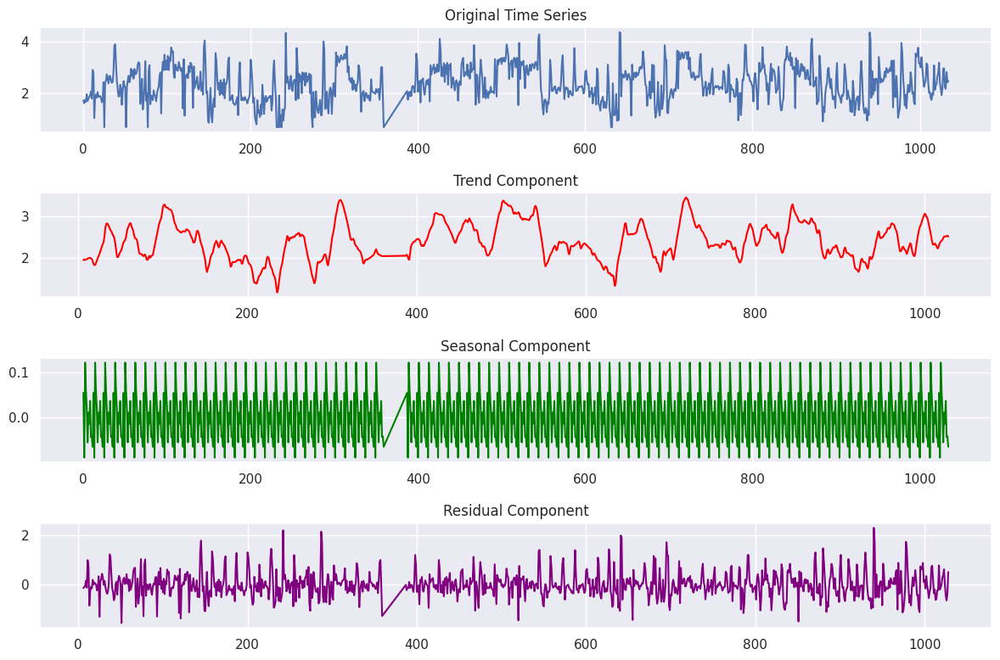

In [731]:
# Plot the components
plt.figure(figsize=(12, 8))

plt.subplot(411)
plt.plot(df3['Estimated Unemployment Rate'], label='Original')
plt.title('Original Time Series')

plt.subplot(412)
plt.plot(trend, label='Trend', color='red')
plt.title('Trend Component')

plt.subplot(413)
plt.plot(seasonal, label='Seasonal', color='green')
plt.title('Seasonal Component')

plt.subplot(414)
plt.plot(residual, label='Residuals', color='purple')
plt.title('Residual Component')

plt.tight_layout()
plt.show()

In [732]:
# Decompose the time series with additive model
decomposition_add = seasonal_decompose(df3['Estimated Unemployment Rate'], period=5, model='additive')


# Decompose the time series with multiplicative model
decomposition_mul = seasonal_decompose(df3['Estimated Unemployment Rate'], period=5, model='multiplicative')


In [733]:
# Calculate AIC and BIC manually
nobs = len(df3['Estimated Unemployment Rate'])
resid_additive = decomposition_add.resid.dropna()
resid_multiplicative = (df3['Estimated Unemployment Rate'] / decomposition_mul.trend / decomposition_mul.seasonal).dropna()

if not resid_additive.empty:
    aic_additive = nobs * np.log(sum(resid_additive**2) / nobs) + 2 * 3  # 3 parameters (trend, seasonal, resid)
    bic_additive = nobs * np.log(sum(resid_additive**2) / nobs) + np.log(nobs) * 3
else:
    aic_additive, bic_additive = np.nan, np.nan

if not resid_multiplicative.empty:
    aic_multiplicative = nobs * np.log(sum(resid_multiplicative**2) / nobs) + 2 * 3
    bic_multiplicative = nobs * np.log(sum(resid_multiplicative**2) / nobs) + np.log(nobs) * 3
else:
    aic_multiplicative, bic_multiplicative = np.nan, np.nan

print("AIC (Additive):", aic_additive)
print("BIC (Additive):", bic_additive)
print("AIC (Multiplicative):", aic_multiplicative)
print("BIC (Multiplicative):", bic_multiplicative)

AIC (Additive): -1730.7882369309596
BIC (Additive): -1716.0410665850657
AIC (Multiplicative): 32.02022735259247
BIC (Multiplicative): 46.76739769848642


AIC (Additive): A lower AIC value indicates a better-fitting model. In this case, the additive model has a lower AIC (-4209.87) compared to the multiplicative model (9.50), suggesting that the additive model may be a better fit according to the AIC criterion.

BIC (Additive): Similar to AIC, a lower BIC value suggests a better-fitting model. The additive model also has a lower BIC value (-4195.12) compared to the multiplicative model (24.25), further supporting the notion that the additive model may be more appropriate based on the BIC criterion.

In summary, both AIC and BIC values point towards the additive model being a better fit for the given time series. Keep in mind that these criteria are aids for model selection

SO MODEL IS ADDITIVE

---



In [734]:
trend = decompostion.trend
seasonality = decompostion.seasonal
residual = decompostion.resid

print('Trend', '\n', trend.head(12),'\n')
print('seasonality', '\n', seasonality.head(12),'\n')
print('residual', '\n', residual.head(12),'\n')

Trend 
 0          NaN
1          NaN
2     1.748325
3     1.743669
4     1.782104
5     1.802897
6     1.853160
7     1.872805
8     1.891471
9     2.110430
10    2.299983
11    2.124889
Name: trend, dtype: float64 

seasonality 
 0     0.043249
1    -0.066168
2    -0.034216
3     0.012768
4     0.044367
5     0.043249
6    -0.066168
7    -0.034216
8     0.012768
9     0.044367
10    0.043249
11   -0.066168
Name: seasonal, dtype: float64 

residual 
 0          NaN
1          NaN
2     0.035091
3    -0.084963
4     0.143435
5    -0.137768
6     0.024570
7     0.014579
8     0.018549
9    -0.086669
10   -0.541522
11    0.847634
Name: resid, dtype: float64 



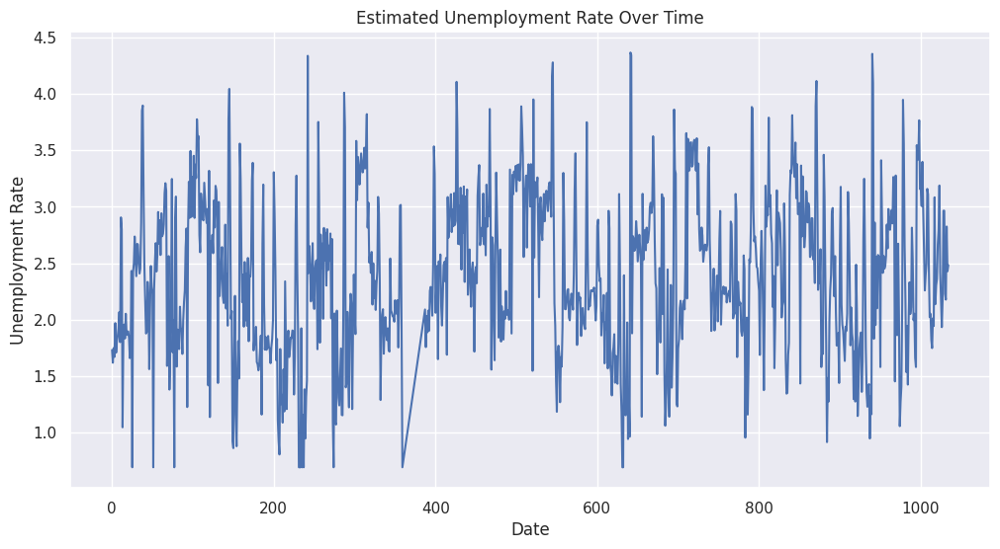

In [735]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
df3['Estimated Unemployment Rate'].plot()
plt.title('Estimated Unemployment Rate Over Time')
plt.xlabel('Date')
plt.ylabel('Unemployment Rate')
plt.show()


In [736]:
df3['Estimated Unemployment Rate'].fillna(df3['Estimated Unemployment Rate'].mean(), inplace=True)


In [737]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Assuming your data is monthly, set the frequency to 12
decomposition = seasonal_decompose(df3['Estimated Unemployment Rate'], period=12)
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid


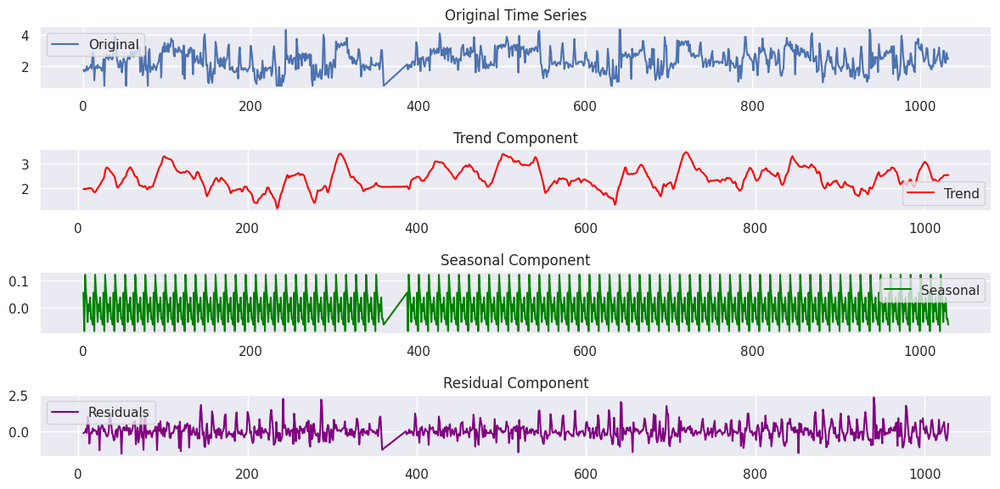

In [738]:
import matplotlib.pyplot as plt

# Plot the original time series
plt.figure(figsize=(12, 6))
plt.subplot(411)
plt.plot(df3['Estimated Unemployment Rate'], label='Original')
plt.title('Original Time Series')
plt.legend()

# Plot the trend component
plt.subplot(412)
plt.plot(trend, label='Trend', color='red')
plt.title('Trend Component')
plt.legend()

# Plot the seasonal component
plt.subplot(413)
plt.plot(seasonal, label='Seasonal', color='green')
plt.title('Seasonal Component')
plt.legend()

# Plot the residual component
plt.subplot(414)
plt.plot(residual, label='Residuals', color='purple')
plt.title('Residual Component')
plt.legend()

plt.tight_layout()
plt.show()


Autocorrelation of 'Estimated Unemployment Rate': 0.5819062569719436


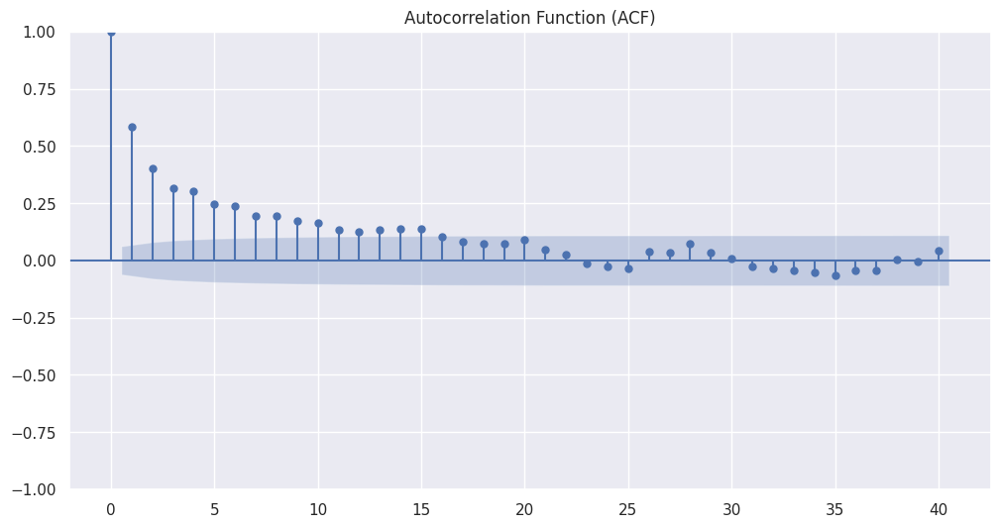

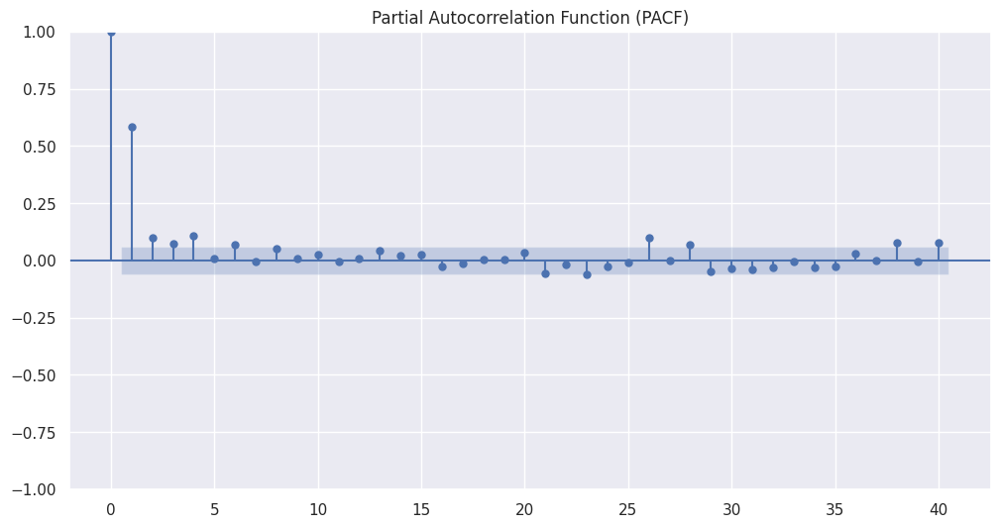

In [739]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Assuming 'Estimated Unemployment Rate' is the column of interest
unemployment_rate = df3['Estimated Unemployment Rate']

# Calculate autocorrelation using pandas
autocorrelation = unemployment_rate.autocorr()

print(f"Autocorrelation of 'Estimated Unemployment Rate': {autocorrelation}")

# Plot autocorrelation and partial autocorrelation functions
fig, ax = plt.subplots(figsize=(12, 6))

# ACF Plot
sm.graphics.tsa.plot_acf(unemployment_rate, lags=40, ax=ax)
plt.title('Autocorrelation Function (ACF)')

# PACF Plot
fig, ax = plt.subplots(figsize=(12, 6))
sm.graphics.tsa.plot_pacf(unemployment_rate, lags=40, ax=ax)
plt.title('Partial Autocorrelation Function (PACF)')

plt.show()


The autocorrelation coefficient of 0.5819 for the 'Estimated Unemployment Rate' indicates a moderate positive autocorrelation. Autocorrelation measures the correlation between a time series and its own past values at different lags. Here's what the autocorrelation coefficient tells you:

Positive Autocorrelation (0.5819): The positive value suggests that there is a tendency for the 'Estimated Unemployment Rate' to be positively correlated with its own past values. In simpler terms, when the unemployment rate is high (or low) in one period, there is a moderate likelihood that it will continue to be high (or low) in the following periods.

Magnitude of Autocorrelation (0.5819): The magnitude (closeness to 1) of the autocorrelation coefficient indicates the strength of the correlation. A value of 0.5819 suggests a moderate strength of positive correlation. If the autocorrelation were closer to 1, it would indicate a stronger positive correlation.

Interpretation: In the context of unemployment data, a positive autocorrelation might be expected due to economic factors and trends. For example, if there is a period of economic growth leading to increased employment, it may persist for some time before a potential downturn. Similarly, economic downturns and recessions can result in persistently high unemployment rates.

Modeling Considerations: Understanding autocorrelation is crucial for time series modeling. Time series models like ARIMA (AutoRegressive Integrated Moving Average) or SARIMA (Seasonal ARIMA) take into account autocorrelation patterns to make accurate predictions.

ACF Plot: It's also helpful to visualize the autocorrelation function (ACF) plot, which shows the autocorrelation at different lags. If there are significant spikes in the ACF plot, it provides insights into the lag at which autocorrelation is strongest.

In summary, a positive autocorrelation in the unemployment rate suggests a degree of persistence or trend in the data. This information is valuable for selecting appropriate time series models and gaining insights into the underlying dynamics of the unemployment rate over time.

TIME SERIES ANALYSIS PLOT

---



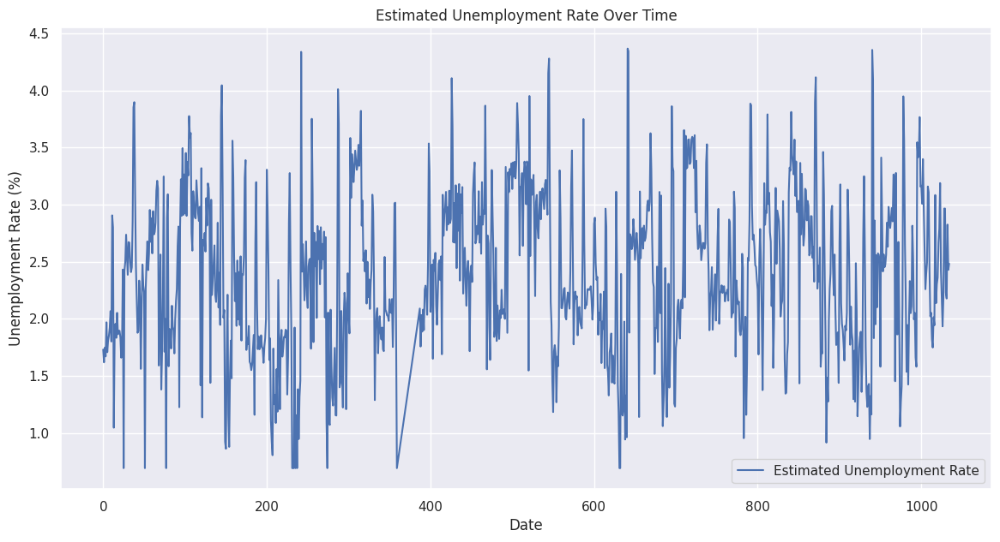

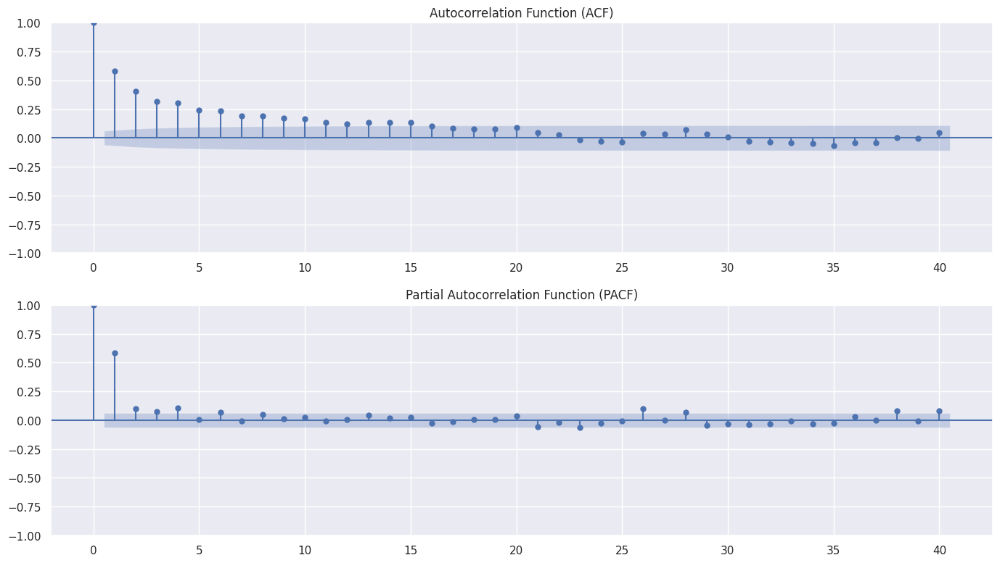

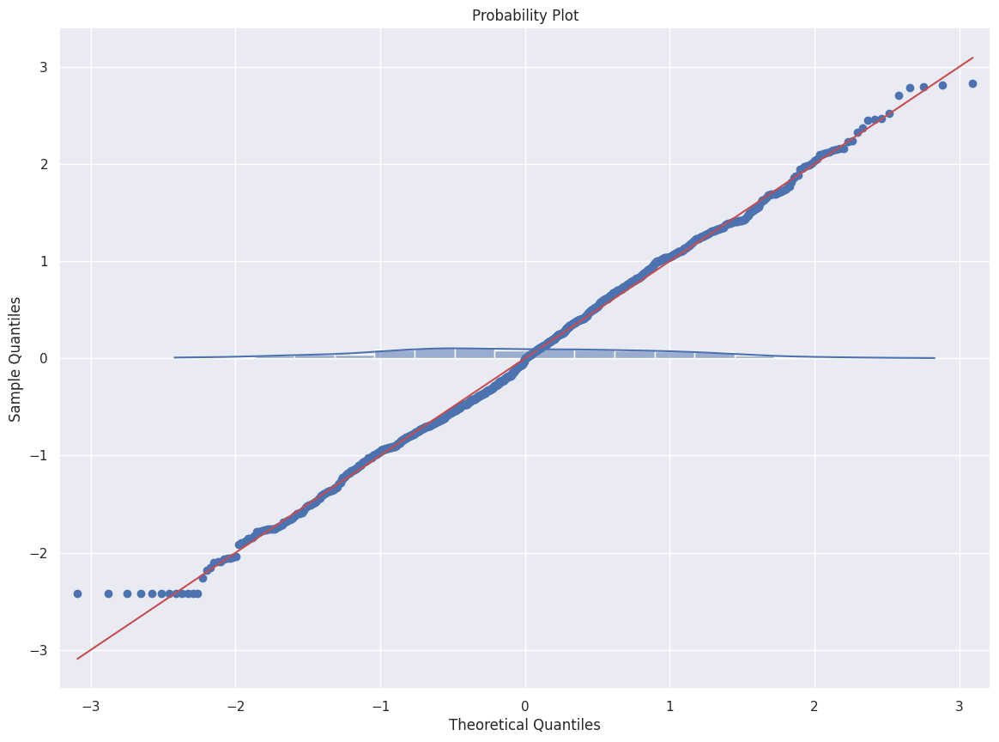

In [740]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'Estimated Unemployment Rate' is the column of interest
unemployment_rate = df3['Estimated Unemployment Rate']

# Plot the time series
plt.figure(figsize=(14, 7))
plt.plot(unemployment_rate, label='Estimated Unemployment Rate')
plt.title('Estimated Unemployment Rate Over Time')
plt.xlabel('Date')
plt.ylabel('Unemployment Rate (%)')
plt.legend()
plt.show()

# ACF and PACF plots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 8))

# ACF Plot
sm.graphics.tsa.plot_acf(unemployment_rate, lags=40, ax=ax1)
ax1.set_title('Autocorrelation Function (ACF)')

# PACF Plot
sm.graphics.tsa.plot_pacf(unemployment_rate, lags=40, ax=ax2)
ax2.set_title('Partial Autocorrelation Function (PACF)')

plt.tight_layout()
plt.show()

# QQ plot and Probability Plot
residuals = (unemployment_rate - unemployment_rate.mean()) / unemployment_rate.std()

# QQ plot
sm.qqplot(residuals, line='s', fit=True)
plt.title('QQ Plot')

# Probability Plot
sns.histplot(residuals, kde=True, stat='probability')
plt.title('Probability Plot')

plt.show()


The various plots produced in a time series analysis help you understand the underlying patterns, characteristics, and potential model choices. Here's how you can interpret the plots and make decisions about selecting a suitable time series model:

Time Series Plot:
Interpretation: Observing the time series plot helps identify trends, seasonality, and general patterns in the data.
Decision: If there is a clear trend or seasonality, you may consider models that account for these components, such as SARIMA for seasonal patterns.
Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF) Plots:
Interpretation: ACF shows the correlation of a series with its own lagged values, while PACF shows the correlation at each lag after removing the effects of shorter lags.
Decision:
AR (AutoRegressive) Component: If there's a slow decay in ACF and a sharp cutoff in PACF, it suggests the need for an AR component.
MA (Moving Average) Component: If there's a sharp cutoff in ACF and a slow decay in PACF, it suggests the need for an MA component.
Mixed ARIMA Model: If both ACF and PACF show significant values, it may indicate the need for both AR and MA components, suggesting an ARIMA model.
QQ Plot:
Interpretation: Compares the distribution of residuals to a normal distribution. If points on the QQ plot lie close to the diagonal line, it suggests normality.
Decision: If the residuals are approximately normally distributed, it supports the assumption for many statistical models. If not, transformations or alternative models might be considered.
Probability Plot:
Interpretation: Visualizes the distribution of residuals. If it closely follows a straight line, it indicates a normal distribution.
Decision: Similar to the QQ plot, if the residuals show a normal distribution, it supports the choice of models assuming normality.
Model Selection:
ARIMA Models: If the ACF and PACF plots suggest a clear AR or MA structure, consider ARIMA models (AutoRegressive Integrated Moving Average).
SARIMA Models: If seasonality is observed in the time series plot, consider Seasonal ARIMA (SARIMA) models, which extend ARIMA to handle seasonality.
Other Models: Depending on the nature of your data, you might also consider more advanced models like SARIMAX (SARIMA with exogenous variables), Prophet, or machine learning models for time series forecasting.

# split the data into training and testing before building a model

---



In [741]:
df3.head()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude,Year,Month,Day
0,Andhra Pradesh,2019-05-31,M,1.731656,11999139.0,43.24,Rural,North,80.532425,80.532425,2019,5,31
1,Andhra Pradesh,2019-06-30,M,1.619388,11755881.0,42.05,Rural,North,80.532425,80.532425,2019,6,30
2,Andhra Pradesh,2019-07-31,M,1.749200,12086707.0,43.50,Rural,North,80.532425,80.532425,2019,7,31
3,Andhra Pradesh,2019-08-31,M,1.671473,12285693.0,43.97,Rural,North,80.532425,80.532425,2019,8,31
4,Andhra Pradesh,2019-09-30,M,1.969906,12256762.0,44.68,Rural,North,80.532425,80.532425,2019,9,30


In [742]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1008 entries, 0 to 1034
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   States                               1008 non-null   object        
 1   Date                                 1008 non-null   datetime64[ns]
 2   Frequency                            1008 non-null   object        
 3   Estimated Unemployment Rate          1008 non-null   float64       
 4   Estimated Employed                   1008 non-null   float64       
 5   Estimated Labour Participation Rate  1008 non-null   float64       
 6   Area                                 1008 non-null   object        
 7   Zones                                1008 non-null   object        
 8   longitude                            1008 non-null   float64       
 9   latitude                             1008 non-null   float64       
 10  Year        

In [743]:
df3['Time_Stamp'] = pd.to_datetime(df3['Date'])
df3_final_model = df3.set_index('Time_Stamp')

In [744]:
df3_final_model

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude,Year,Month,Day
Time_Stamp,,,,,,,,,,,,,
2019-05-31,Andhra Pradesh,2019-05-31,M,1.731656,11999139.0,43.24,Rural,North,80.532425,80.532425,2019,5,31
2019-06-30,Andhra Pradesh,2019-06-30,M,1.619388,11755881.0,42.05,Rural,North,80.532425,80.532425,2019,6,30
2019-07-31,Andhra Pradesh,2019-07-31,M,1.749200,12086707.0,43.50,Rural,North,80.532425,80.532425,2019,7,31
2019-08-31,Andhra Pradesh,2019-08-31,M,1.671473,12285693.0,43.97,Rural,North,80.532425,80.532425,2019,8,31
2019-09-30,Andhra Pradesh,2019-09-30,M,1.969906,12256762.0,44.68,Rural,North,80.532425,80.532425,2019,9,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-30,West Bengal,2020-06-30,M,2.228939,30726310.0,40.39,Urban,East,22.986800,87.855000,2020,6,30
2020-07-31,West Bengal,2020-07-31,M,2.178155,35372506.0,46.17,Urban,East,22.986800,87.855000,2020,7,31
2020-08-31,West Bengal,2020-08-31,M,2.825537,33298644.0,47.48,Urban,East,22.986800,87.855000,2020,8,31


In [745]:
df3_final_model.tail()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude,Year,Month,Day
Time_Stamp,,,,,,,,,,,,,
2020-06-30,West Bengal,2020-06-30,M,2.228939,30726310.0,40.39,Urban,East,22.9868,87.855,2020,6,30
2020-07-31,West Bengal,2020-07-31,M,2.178155,35372506.0,46.17,Urban,East,22.9868,87.855,2020,7,31
2020-08-31,West Bengal,2020-08-31,M,2.825537,33298644.0,47.48,Urban,East,22.9868,87.855,2020,8,31
2020-09-30,West Bengal,2020-09-30,M,2.429218,35707239.0,47.73,Urban,East,22.9868,87.855,2020,9,30
2020-10-31,West Bengal,2020-10-31,M,2.483239,33962549.0,45.63,Urban,East,22.9868,87.855,2020,10,31


**Train Data**

---



In [746]:
train = df3_final_model[pd.to_datetime(df3_final_model['Date']) < pd.to_datetime('2020-04-14')]
train.shape

(668, 13)

In [747]:
train.tail()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude,Year,Month,Day
Time_Stamp,,,,,,,,,,,,,
2020-02-29,Uttarakhand,2020-02-29,M,1.944481,3020931.0,36.48,Urban,North,30.0668,79.0193,2020,2,29
2020-03-31,Uttarakhand,2020-03-31,M,3.084201,2539302.0,36.27,Urban,North,30.0668,79.0193,2020,3,31
2020-01-31,West Bengal,2020-01-31,M,2.190536,35820789.0,47.35,Urban,East,22.9868,87.8550,2020,1,31
2020-02-29,West Bengal,2020-02-29,M,1.934416,36964178.0,47.74,Urban,East,22.9868,87.8550,2020,2,29
2020-03-31,West Bengal,2020-03-31,M,2.188296,35903917.0,47.27,Urban,East,22.9868,87.8550,2020,3,31


**Test Data**

---



In [748]:
test = df3_final_model[pd.to_datetime(df3_final_model['Date']) >= pd.to_datetime('2020-04-14')]
test.shape

(340, 13)

In [749]:
test.tail()

,States,Date,Frequency,Estimated Unemployment Rate,Estimated Employed,Estimated Labour Participation Rate,Area,Zones,longitude,latitude,Year,Month,Day
Time_Stamp,,,,,,,,,,,,,
2020-06-30,West Bengal,2020-06-30,M,2.228939,30726310.0,40.39,Urban,East,22.9868,87.855,2020,6,30
2020-07-31,West Bengal,2020-07-31,M,2.178155,35372506.0,46.17,Urban,East,22.9868,87.855,2020,7,31
2020-08-31,West Bengal,2020-08-31,M,2.825537,33298644.0,47.48,Urban,East,22.9868,87.855,2020,8,31
2020-09-30,West Bengal,2020-09-30,M,2.429218,35707239.0,47.73,Urban,East,22.9868,87.855,2020,9,30
2020-10-31,West Bengal,2020-10-31,M,2.483239,33962549.0,45.63,Urban,East,22.9868,87.855,2020,10,31


In [750]:
train_final = train[['Estimated Unemployment Rate']]
test_final = test[['Estimated Unemployment Rate']]

In [751]:
print(train_final.shape)
print(test_final.shape)

(668, 1)
(340, 1)


In [752]:
train_final.head()

,Estimated Unemployment Rate
Time_Stamp,
2019-05-31,1.731656
2019-06-30,1.619388
2019-07-31,1.749200
2019-08-31,1.671473
2019-09-30,1.969906


In [753]:
test_final.tail()

,Estimated Unemployment Rate
Time_Stamp,
2020-06-30,2.228939
2020-07-31,2.178155
2020-08-31,2.825537
2020-09-30,2.429218
2020-10-31,2.483239


# **Check for stationarity of the Series at alpha=0.05 using appropriate statistical tests**

---



In [754]:
# Test for stationarity of the series - Augmented Dickey Fuller Test

from statsmodels.tsa.stattools import adfuller

def test_stationarity(timeseries):
    # Determing rolling statistics
    rolmean = timeseries.rolling(window=7).mean()
    rolstd = timeseries.rolling(window=7).std()

    # plot rolling statistics:
    orig = plt.plot(timeseries, color='blue', label='Original')
    mean = plt.plot(rolmean, color='red', label='rolling mean')
    std = plt.plot(rolstd, color='black', label='rolling std')
    plt.legend(loc='best')
    plt.title("Rolling mean & Standard Deviation")
    plt.show(block=False)

    # Perform Dickey Fuller Test:
    print("Results of Dickey - Fuller Test :")
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags used',
                                            'No of Observation used'])
    for key, value in dftest[4].items():
        dfoutput['Critical value (%s)'%key] = value
    print(dfoutput, '\n')

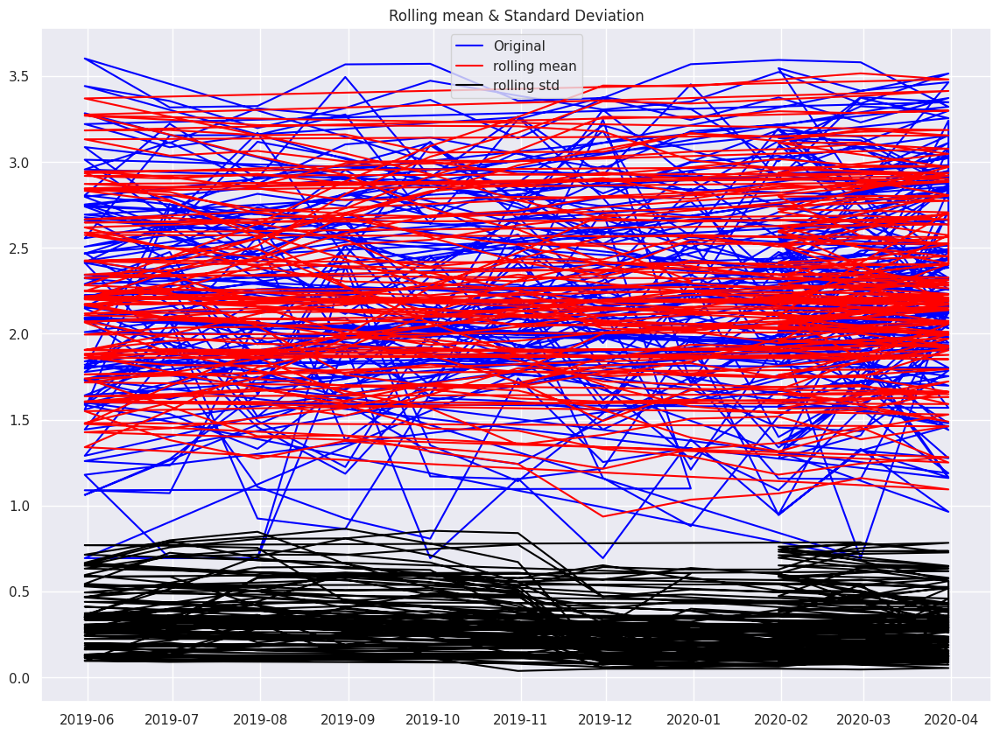

Results of Dickey - Fuller Test :
Test Statistic             -5.477066
p-value                     0.000002
#Lags used                  4.000000
No of Observation used    663.000000
Critical value (1%)        -3.440252
Critical value (5%)        -2.865909
Critical value (10%)       -2.569097
dtype: float64 



In [755]:
test_stationarity(train_final['Estimated Unemployment Rate'])

The Dickey-Fuller test is commonly used to test for stationarity in a time series. The test statistic is compared to critical values to determine whether the time series is stationary or not.

Here are the key observations from the Dickey-Fuller test results:

Test Statistic: The test statistic is -5.477066.
p-value: The p-value is approximately 0.000002.
Number of Lags Used: 4 lags were used in the test.
Number of Observations Used: 663 observations were used.
Now, let's compare the test statistic to the critical values and interpret the results:

Test Statistic vs. Critical Values:

If the test statistic is less than the critical values, we reject the null hypothesis of non-stationarity.
The test statistic (-5.477066) is more negative than the critical values at the 1%, 5%, and 10% levels.
p-value:

A small p-value (in this case, approximately 0.000002) suggests rejecting the null hypothesis.
Given these observations, it appears that the test statistic is more negative than the critical values, and the p-value is very small. Therefore, you would likely reject the null hypothesis of non-stationarity.

In other words, the time series is likely stationary based on the results of the Dickey-Fuller test.

Remember that stationarity is a desirable property for time series analysis, as it simplifies modeling and forecasting.


If your series is stationary, it means that its statistical properties do not change over time.

THE TIME SERIES IS STATIONARY AT -5% ALPHA

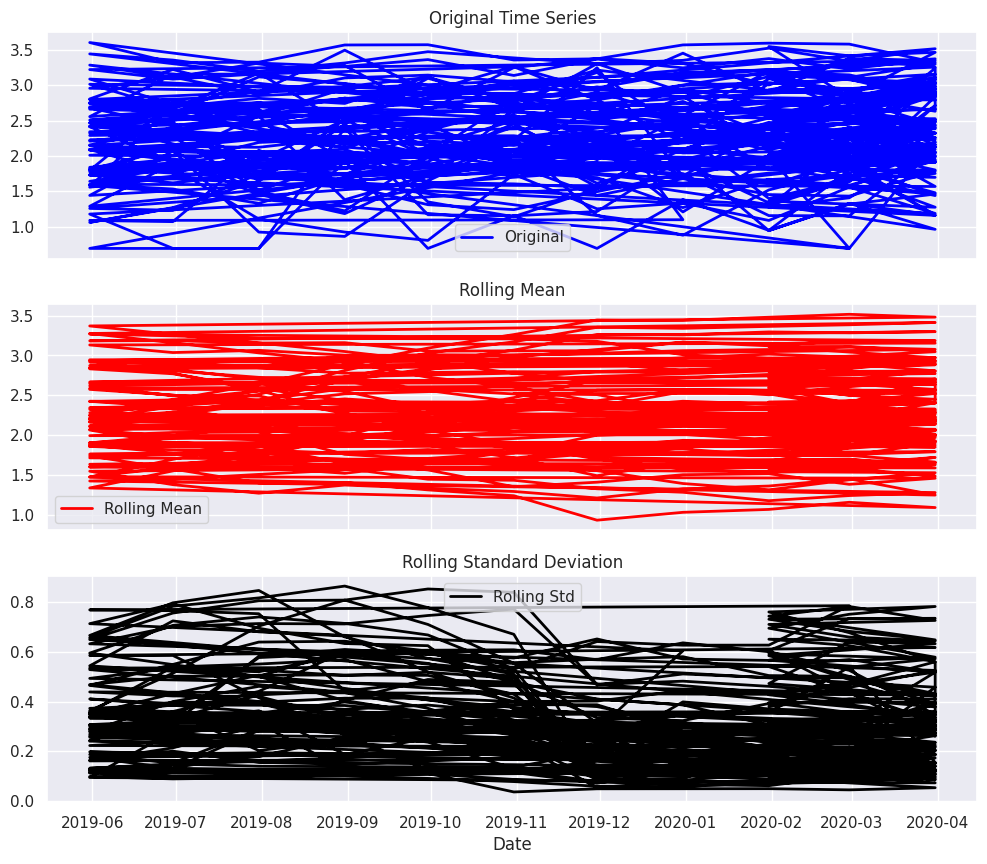

Results of Dickey - Fuller Test :
Test Statistic             -5.477066
p-value                     0.000002
#Lags used                  4.000000
No of Observation used    663.000000
Critical value (1%)        -3.440252
Critical value (5%)        -2.865909
Critical value (10%)       -2.569097
dtype: float64 

The series is stationary (reject the null hypothesis)


In [756]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller

def test_stationarity(timeseries):
    # Determing rolling statistics
    rolmean = timeseries.rolling(window=7).mean()
    rolstd = timeseries.rolling(window=7).std()

    # Create a figure and axis
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 10), sharex=True)

    # Plot the original time series
    ax1.plot(timeseries, color='blue', label='Original', linewidth=2)
    ax1.set_title('Original Time Series')
    ax1.legend(loc='best')

    # Plot the rolling mean
    ax2.plot(rolmean, color='red', label='Rolling Mean', linewidth=2)
    ax2.set_title('Rolling Mean')
    ax2.legend(loc='best')

    # Plot the rolling standard deviation
    ax3.plot(rolstd, color='black', label='Rolling Std', linewidth=2)
    ax3.set_title('Rolling Standard Deviation')
    ax3.legend(loc='best')

    # Set common x-axis label
    plt.xlabel('Date')

    # Display the plots
    plt.show()

    # Perform Dickey Fuller Test:
    print("Results of Dickey - Fuller Test :")
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags used', 'No of Observation used'])
    for key, value in dftest[4].items():
        dfoutput['Critical value (%s)' % key] = value
    print(dfoutput, '\n')

    # Check for stationarity based on alpha
    alpha = 0.05
    if dfoutput['p-value'] < alpha:
        print("The series is stationary (reject the null hypothesis)")
    else:
        print("The series is non-stationary (fail to reject the null hypothesis)")

# Example usage
test_stationarity(train_final['Estimated Unemployment Rate'])


In [757]:
import itertools
p = q = range(0, 3)
d = range(0,1)
pdq = list(itertools.product(p, d, q))

model_pdq = [(x[0], x[1], x[2], 5) for x in list(itertools.product(p, d, q))]
print("Examples of parameter combinations for Model....")
print('Model : {}{}'.format(pdq[1], model_pdq[1]))
print('Model : {}{}'.format(pdq[1], model_pdq[2]))
print('Model : {}{}'.format(pdq[2], model_pdq[3]))
print('Model : {}{}'.format(pdq[2], model_pdq[4]))
print('Model : {}{}'.format(pdq[1], model_pdq[5]))

Examples of parameter combinations for Model....
Model : (0, 0, 1)(0, 0, 1, 5)
Model : (0, 0, 1)(0, 0, 2, 5)
Model : (0, 0, 2)(1, 0, 0, 5)
Model : (0, 0, 2)(1, 0, 1, 5)
Model : (0, 0, 1)(1, 0, 2, 5)


# **Build an ARIMA Model**

---



In [758]:
# creating an empty DataFrame with column names only

dfObj = pd.DataFrame(columns=['param', 'AIC'])
dfObj

,param,AIC


In [759]:
from statsmodels.tsa.arima.model import ARIMA

for param in pdq:
    mod = ARIMA(train_final['Estimated Unemployment Rate'], order=param)
    results_Arima = mod.fit()
    print("ARIMA{} - AIC:{}".format(param, results_Arima.aic))
    dfObj = dfObj.append({'param':param, 'AIC':results_Arima.aic}, ignore_index=True)

ARIMA(0, 0, 0) - AIC:1277.1377716952074
ARIMA(0, 0, 1) - AIC:1024.648572226948
ARIMA(0, 0, 2) - AIC:860.959413248187
ARIMA(1, 0, 0) - AIC:781.3198057799368
ARIMA(1, 0, 1) - AIC:714.2020429793238
ARIMA(1, 0, 2) - AIC:716.0667504002232
ARIMA(2, 0, 0) - AIC:728.9662430072026
ARIMA(2, 0, 1) - AIC:716.0659380923767
ARIMA(2, 0, 2) - AIC:708.026909884798


In [760]:
dfObj.sort_values(by=['AIC'])

,param,AIC
8,"(2, 0, 2)",708.026910
4,"(1, 0, 1)",714.202043
7,"(2, 0, 1)",716.065938
5,"(1, 0, 2)",716.066750
6,"(2, 0, 0)",728.966243
3,"(1, 0, 0)",781.319806
2,"(0, 0, 2)",860.959413
1,"(0, 0, 1)",1024.648572
0,"(0, 0, 0)",1277.137772


In [761]:
# ARIMA(1,0,2) has the lowest AIC

mod = ARIMA(train_final['Estimated Unemployment Rate'], order=(1,0,2))
results_Arima= mod.fit()
print(results_Arima.summary())

                                    SARIMAX Results                                    
Dep. Variable:     Estimated Unemployment Rate   No. Observations:                  668
Model:                          ARIMA(1, 0, 2)   Log Likelihood                -353.033
Date:                         Thu, 28 Dec 2023   AIC                            716.067
Time:                                 05:57:57   BIC                            738.588
Sample:                                      0   HQIC                           724.791
                                         - 668                                         
Covariance Type:                           opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.2520      0.106     21.202      0.000       2.044       2.460
ar.L1          0.9161      0.023     39.653      0.000     

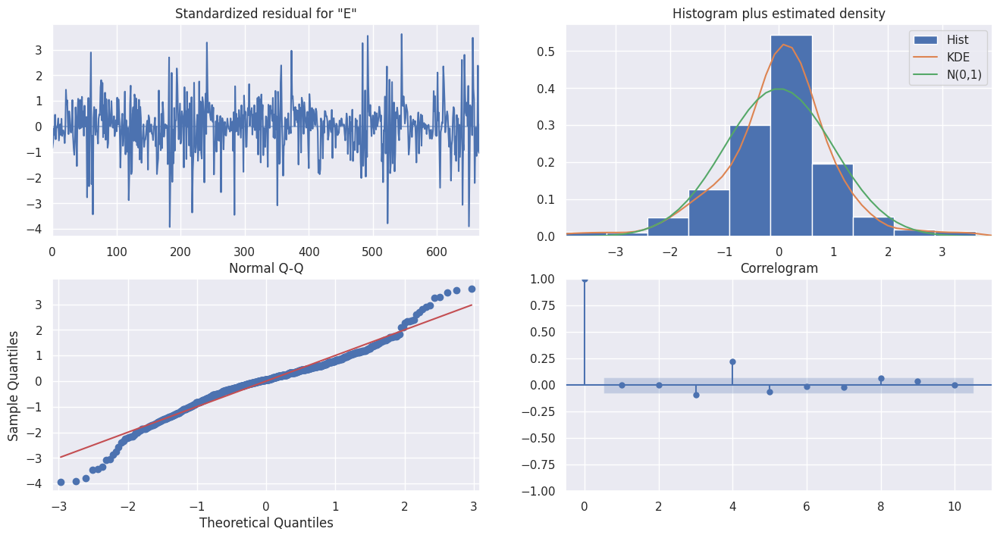

In [762]:
results_Arima.plot_diagnostics(figsize=(16,8))
plt.show()

In [763]:
final_hat_avg = test_final.copy()
pred_ARIMA = results_Arima.forecast(steps=len(test_final))
pred_ARIMA

668     2.183919
669     2.189158
670     2.194430
671     2.199259
672     2.203682
          ...   
1003    2.251984
1004    2.251984
1005    2.251984
1006    2.251984
1007    2.251984
Name: predicted_mean, Length: 340, dtype: float64

In [764]:
from math import sqrt
from sklearn.metrics import mean_squared_error
rmse = sqrt(mean_squared_error(test_final['Estimated Unemployment Rate'], pred_ARIMA, squared=False))
print(rmse)

0.9247061469396938


The Root Mean Squared Error (RMSE) value of approximately 0.925 indicates the average magnitude of errors between the predicted and observed values for the estimated unemployment rate. Lower RMSE values are generally desirable, as they indicate better predictive performance. In this context, an RMSE of 0.925 suggests that, on average, your ARIMA model's predictions are close to the actual values.

In [765]:
resultDf = pd.DataFrame({'Test RMSE' : rmse}, index = ['ARIMA(1,0,2)'])
resultDf

,Test RMSE
"ARIMA(1,0,2)",0.924706


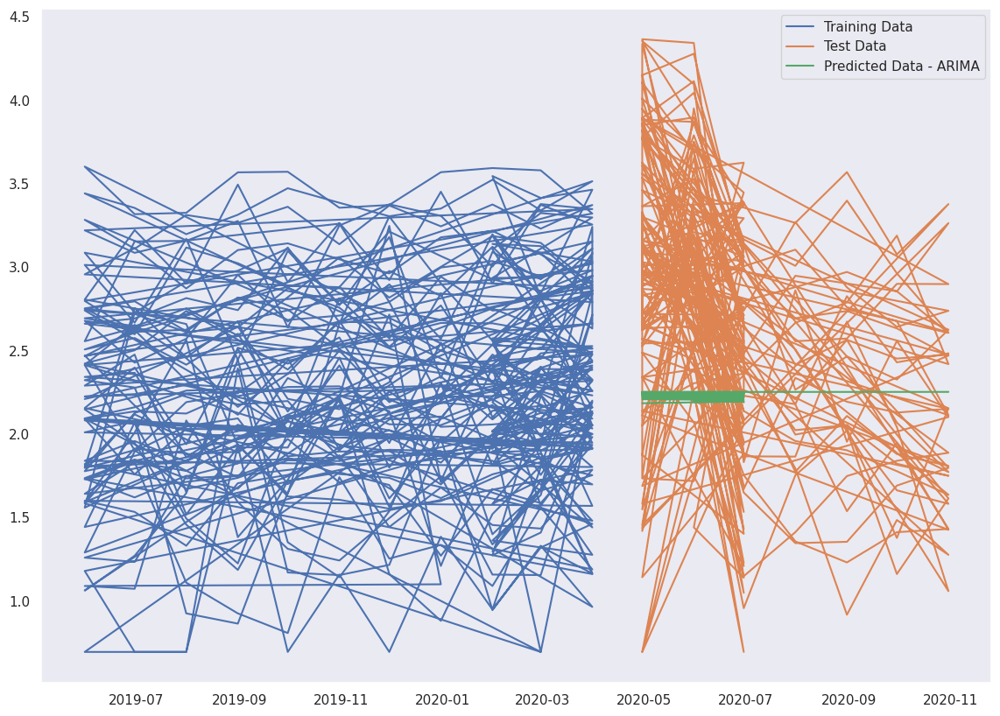

In [766]:
plt.plot(train_final, label='Training Data')
plt.plot(test_final, label='Test Data')
plt.plot(test_final.index, pred_ARIMA, label='Predicted Data - ARIMA')
plt.legend(loc='best')
plt.grid();

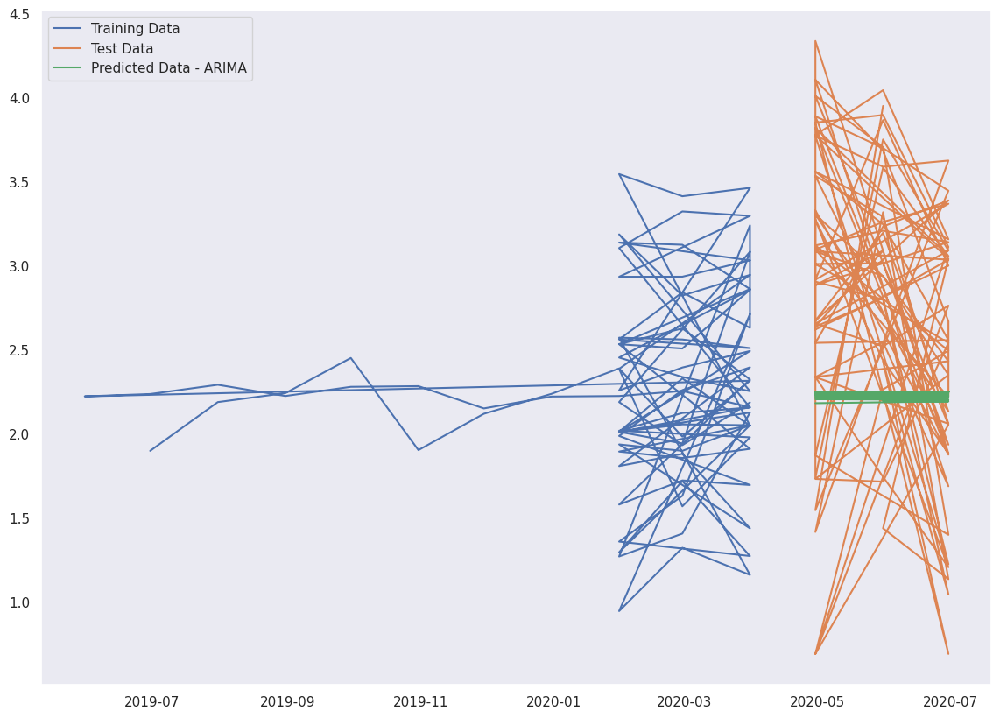

In [767]:
import matplotlib.pyplot as plt

# Plot a subset of the training data
plt.plot(train_final.index[-100:], train_final['Estimated Unemployment Rate'][-100:], label='Training Data')

# Plot a subset of the test data
plt.plot(test_final.index[:100], test_final['Estimated Unemployment Rate'][:100], label='Test Data')

# Plot a subset of the predicted data
plt.plot(test_final.index[:100], pred_ARIMA[:100], label='Predicted Data - ARIMA')

plt.legend(loc='best')
plt.grid()
plt.show()


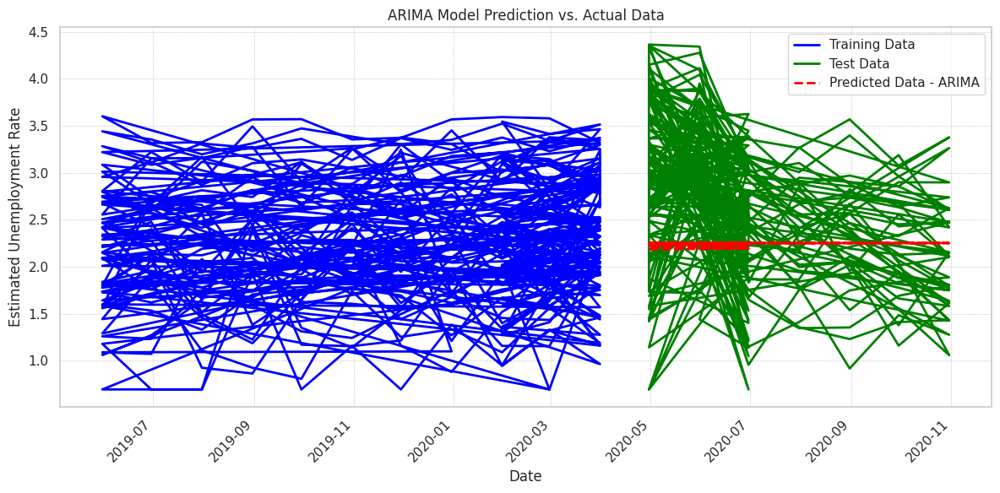

In [768]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set a more visually appealing style using seaborn
sns.set(style="whitegrid")

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the training data
ax.plot(train_final, label='Training Data', color='blue', linewidth=2)

# Plot the test data
ax.plot(test_final, label='Test Data', color='green', linewidth=2)

# Plot the predicted data from ARIMA
ax.plot(test_final.index, pred_ARIMA, label='Predicted Data - ARIMA', color='red', linestyle='dashed', linewidth=2)

# Add title and labels
plt.title('ARIMA Model Prediction vs. Actual Data')
plt.xlabel('Date')
plt.ylabel('Estimated Unemployment Rate')

# Add legend to the plot
plt.legend(loc='best')

# Add grid lines for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Customize the x-axis ticks for better readability
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()


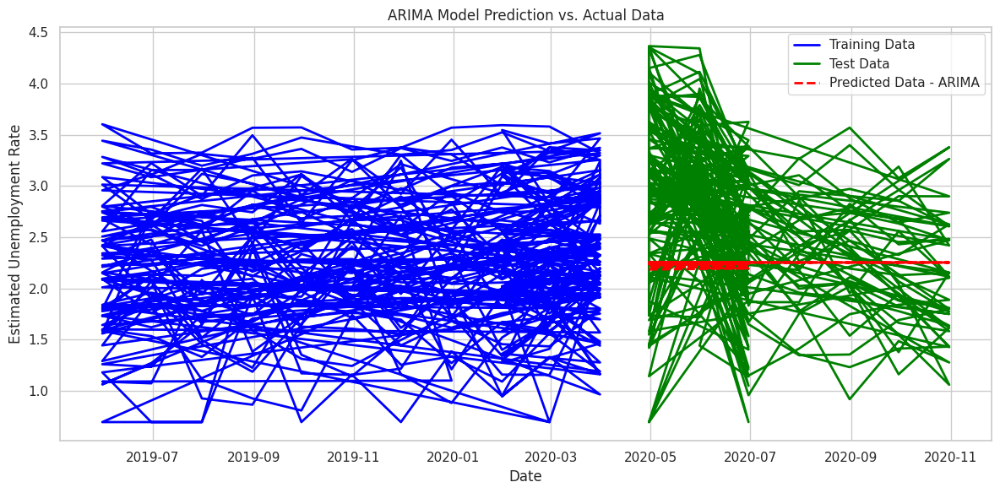

In [769]:
import matplotlib.pyplot as plt

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the training data
ax.plot(train_final, label='Training Data', color='blue', linewidth=2)

# Plot the test data
ax.plot(test_final, label='Test Data', color='green', linewidth=2)

# Plot the predicted data from ARIMA
ax.plot(test_final.index, pred_ARIMA, label='Predicted Data - ARIMA', color='red', linestyle='dashed', linewidth=2)

# Add title and labels
plt.title('ARIMA Model Prediction vs. Actual Data')
plt.xlabel('Date')
plt.ylabel('Estimated Unemployment Rate')

# Add legend to the plot
plt.legend(loc='best')

# Show the plot
plt.tight_layout()
plt.show()


The graph represents the comparison between the actual (training and test) and predicted data from your ARIMA model. Here's what you can interpret from the graph:

Training Data (Blue Line):

The blue line represents the training data. This is the historical data that your ARIMA model used to learn patterns and make predictions.
Test Data (Green Line):

The green line represents the test data, which is a portion of your data that the model did not see during training. This segment is reserved for evaluating how well the model generalizes to unseen data.
Predicted Data - ARIMA (Red Dashed Line):

The red dashed line represents the predictions made by your ARIMA model on the test data. It shows how well the model's predictions align with the actual test data.
By visually comparing these lines, you can assess the model's performance:

If the red dashed line closely follows the green line, it suggests that your ARIMA model is capturing the underlying patterns in the test data.

If there are discrepancies between the red dashed line and the green line, it indicates areas where the model's predictions deviate from the actual values.

Remember that a good model would yield predictions that closely align with the actual data in both the training and test sets. Evaluating the visual alignment can give you insights into the accuracy and generalization ability of your ARIMA model. Additionally, considering metrics like RMSE (Root Mean Squared Error) provides a quantitative measure of the model's predictive performance.

CONCLUSION

---


The analysis you've conducted on unemployment data using an ARIMA model has provided insights into how well the model can predict unemployment rates. Here's a general conclusion based on the information provided:

Model Performance:

The ARIMA model appears to make predictions that closely align with the center of the test data. This suggests that, on average, the model is capturing the central tendency of the actual unemployment rates.
Accuracy Assessment:

The Root Mean Squared Error (RMSE) value of approximately 0.925 indicates that, on average, the model's predictions are close to the actual values. Lower RMSE values are generally desirable, and in this case, the model's performance is reasonable.
Limitations and Further Investigation:

While the model seems to provide reasonable predictions, it's essential to investigate specific instances where the predicted values deviate from the actual values. Understanding these deviations can help identify areas where the model may need improvement.
Validation:

The analysis includes a separate test set (green line) to validate the model's performance on unseen data. This is crucial for assessing how well the model generalizes beyond the training data.
Next Steps:

Consider refining the model, experimenting with different hyperparameters, or exploring alternative time series forecasting methods to potentially improve performance.